In [1]:
import numpy as np
import time
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader, random_split
import torch.optim as optim
import matplotlib.pyplot as plt
import sys, os

project_root = os.path.abspath(os.path.join(os.getcwd(), '..', '..'))
sys.path.append(project_root)

from Resources.Model import Model_v27
from Resources.Game import *


### Initializing shared game stats
##### Only once st the start

In [11]:
# stats = torch.Tensor([0, 0, 0, 0]) # batch index, white wins, black wins, draws
# torch.save(stats, '/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v27/stats')

##### Initialize Model

In [12]:
model = Model_v27()
model_saves = os.listdir('../Monte Carlo/Model Saves MC v27')
if len(model_saves) > 0:
    newest_model = max(int(i[6:-8]) for i in model_saves)
    latest_batch_index = newest_model
    model.load_state_dict(torch.load('../Monte Carlo/Model Saves MC v27/model_{}_batches'.format(newest_model)))
criterion = nn.MSELoss()

# error_hist =  []
# latest_batch_index = 0

error_hist = torch.load('./error_hist MC v27')

training batch  530
batches:  530


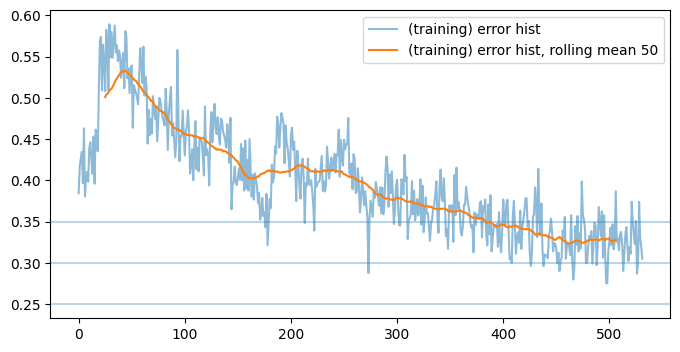

training batch  531
batches:  531
training batch  532
batches:  532
training batch  533
batches:  533
training batch  534
batches:  534
training batch  535
batches:  535
training batch  536
batches:  536
training batch  537
batches:  537
training batch  538
batches:  538
training batch  539
batches:  539
training batch  540
batches:  540


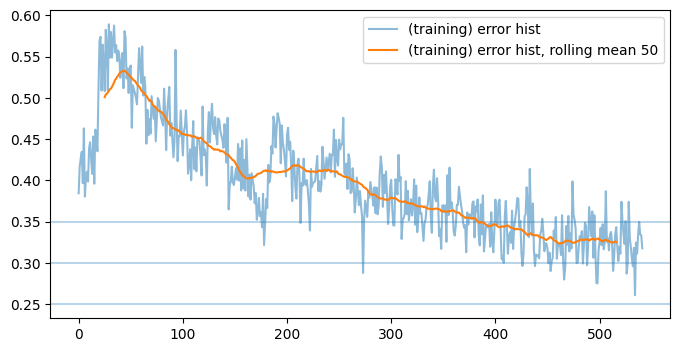

training batch  541
batches:  541
training batch  542
batches:  542
training batch  543
batches:  543
training batch  544
batches:  544
training batch  545
batches:  545
training batch  546
batches:  546
training batch  547
batches:  547
training batch  548
batches:  548
training batch  549
batches:  549
training batch  550
batches:  550


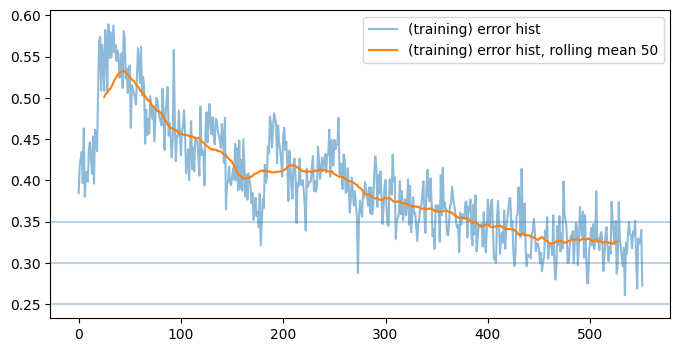

training batch  551
batches:  551
training batch  552
batches:  552
training batch  553
batches:  553
training batch  554
batches:  554
training batch  555
batches:  555
training batch  556
batches:  556
training batch  557
batches:  557
training batch  558
batches:  558
training batch  559
batches:  559
training batch  560
batches:  560


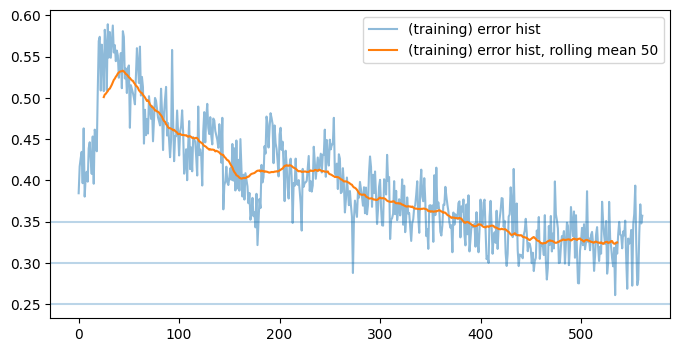

training batch  561
batches:  561
training batch  562
batches:  562
training batch  563
batches:  563
training batch  564
batches:  564
training batch  565
batches:  565
training batch  566
batches:  566
training batch  567
batches:  567
training batch  568
batches:  568
training batch  569
batches:  569
training batch  570
batches:  570


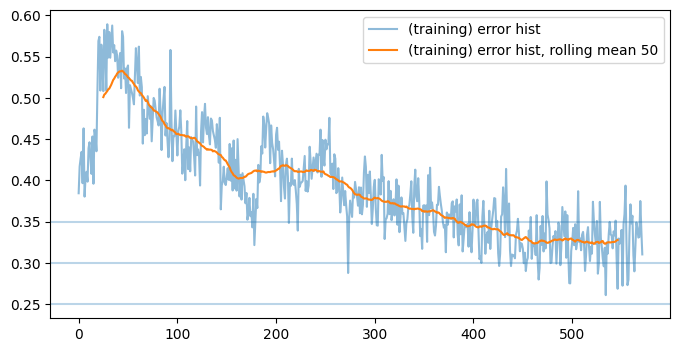

training batch  571
batches:  571
training batch  572
batches:  572
training batch  573
batches:  573
training batch  574
batches:  574
training batch  575
batches:  575
training batch  576
batches:  576
training batch  577
batches:  577
training batch  578
batches:  578
training batch  579
batches:  579
training batch  580
batches:  580


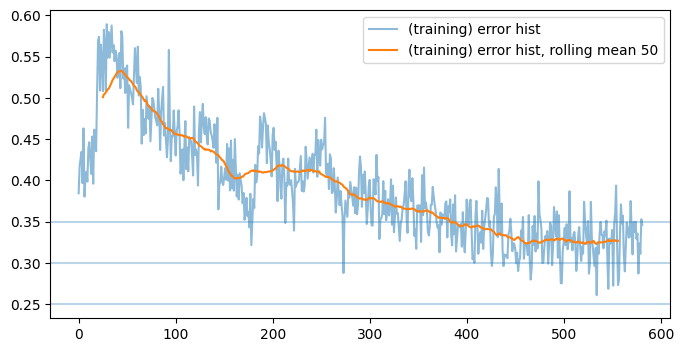

training batch  581
batches:  581
training batch  582
batches:  582
training batch  583
batches:  583
training batch  584
batches:  584
training batch  585
batches:  585
training batch  586
batches:  586
training batch  587
batches:  587
training batch  588
batches:  588
training batch  589
batches:  589
training batch  590
batches:  590


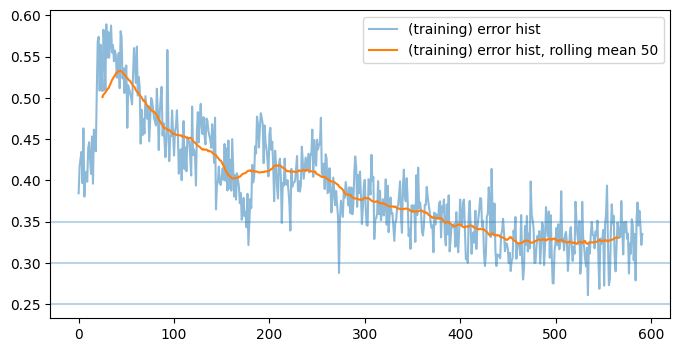

training batch  591
batches:  591
training batch  592
batches:  592
training batch  593
batches:  593
training batch  594
batches:  594
training batch  595
batches:  595
training batch  596
batches:  596
training batch  597
batches:  597
training batch  598
batches:  598
training batch  599
batches:  599
training batch  600
batches:  600


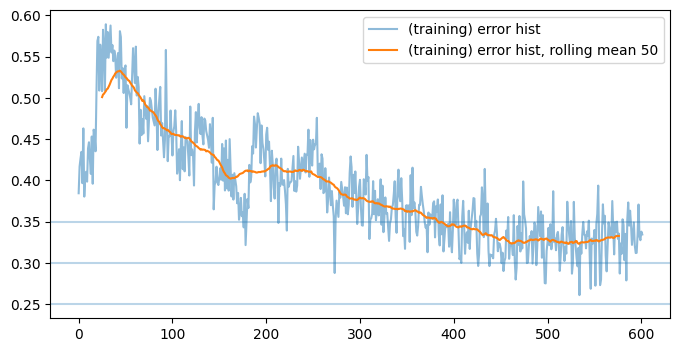

training batch  601
batches:  601
training batch  602
batches:  602
training batch  603
batches:  603
training batch  604
batches:  604
training batch  605
batches:  605
training batch  606
batches:  606
training batch  607
batches:  607
training batch  608
batches:  608
training batch  609
batches:  609
training batch  610
batches:  610


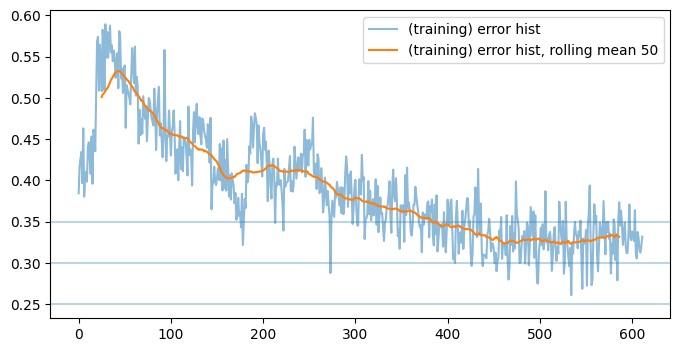

training batch  611
batches:  611
training batch  612
batches:  612
training batch  613
batches:  613
training batch  614
batches:  614
training batch  615
batches:  615
training batch  616
batches:  616
training batch  617
batches:  617
training batch  618
batches:  618
training batch  619
batches:  619
training batch  620
batches:  620


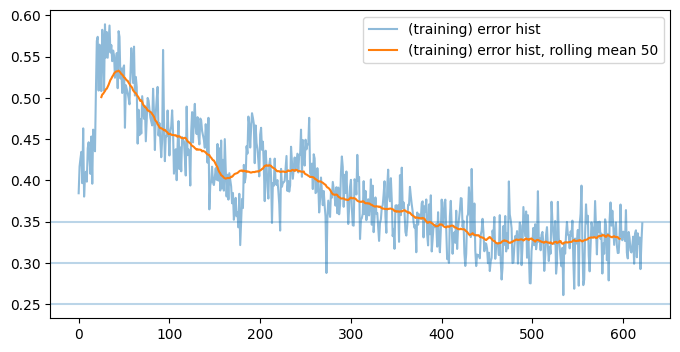

training batch  621
batches:  621
training batch  622
batches:  622
training batch  623
batches:  623
training batch  624
batches:  624
training batch  625
batches:  625
training batch  626
batches:  626
training batch  627
batches:  627
training batch  628
batches:  628
training batch  629
batches:  629
training batch  630
batches:  630


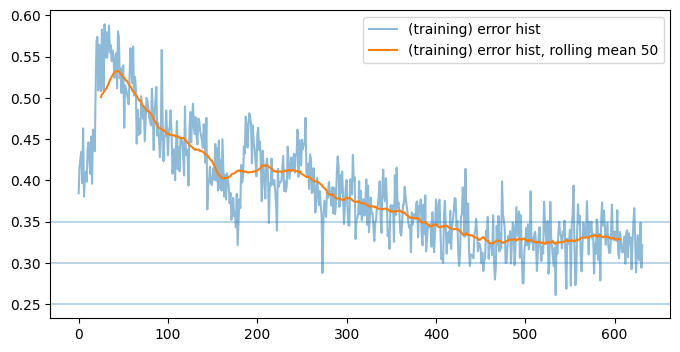

training batch  631
batches:  631
training batch  632
batches:  632
training batch  633
batches:  633
training batch  634
batches:  634
training batch  635
batches:  635
training batch  636
batches:  636
training batch  637
batches:  637
training batch  638
batches:  638
training batch  639
batches:  639
training batch  640
batches:  640


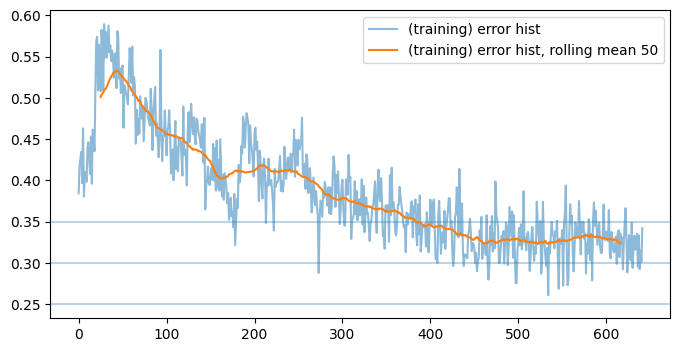

training batch  641
batches:  641
training batch  642
batches:  642
training batch  643
batches:  643
training batch  644
batches:  644
training batch  645
batches:  645
training batch  646
batches:  646
training batch  647
batches:  647
training batch  648
batches:  648
training batch  649
batches:  649
training batch  650
batches:  650


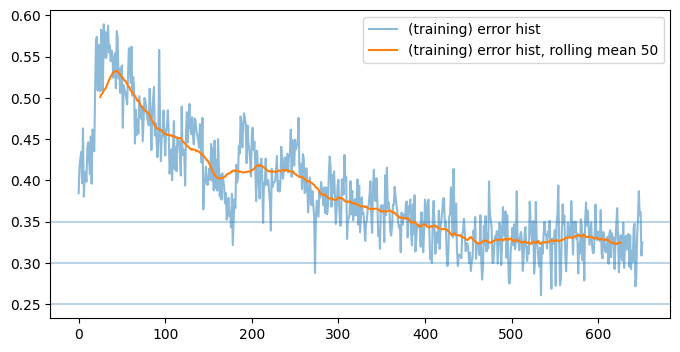

training batch  651
batches:  651
training batch  652
batches:  652
training batch  653
batches:  653
training batch  654
batches:  654
training batch  655
batches:  655
training batch  656
batches:  656
training batch  657
batches:  657
training batch  658
batches:  658
training batch  659
batches:  659
training batch  660
batches:  660


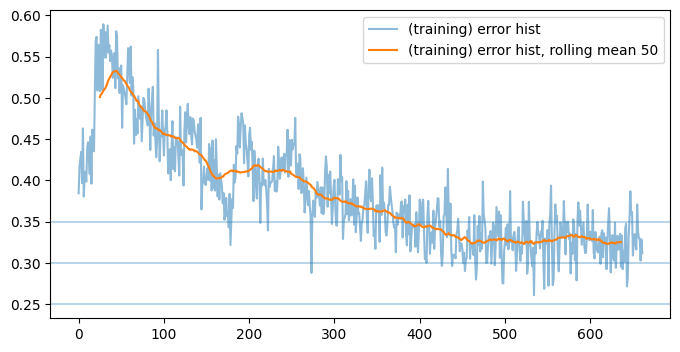

training batch  661
batches:  661
training batch  662
batches:  662
training batch  663
batches:  663
training batch  664
batches:  664
training batch  665
batches:  665
training batch  666
batches:  666
training batch  667
batches:  667
training batch  668
batches:  668
training batch  669
batches:  669
training batch  670
batches:  670


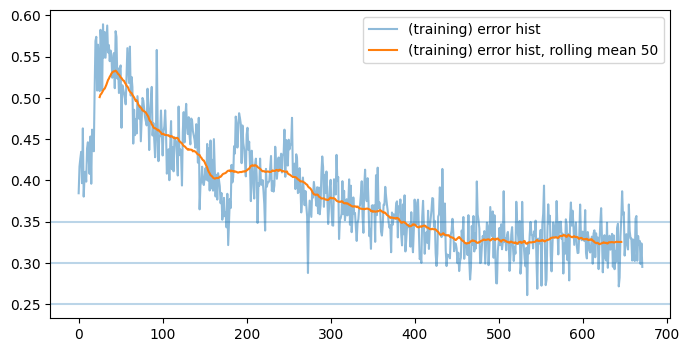

training batch  671
batches:  671
training batch  672
batches:  672
training batch  673
batches:  673
training batch  674
batches:  674
training batch  675
batches:  675
training batch  676
batches:  676
training batch  677
batches:  677
training batch  678
batches:  678
training batch  679
batches:  679
training batch  680
batches:  680


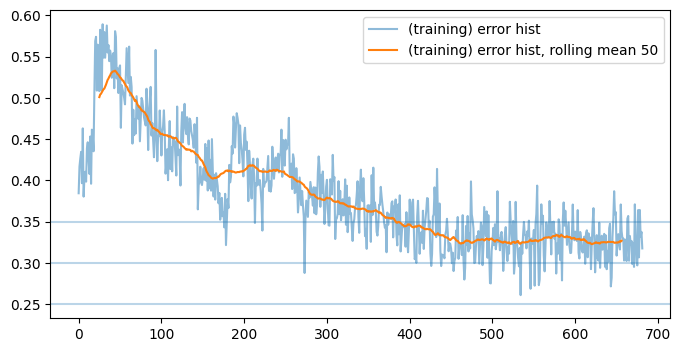

training batch  681
batches:  681
training batch  682
batches:  682
training batch  683
batches:  683
training batch  684
batches:  684
training batch  685
batches:  685
training batch  686
batches:  686
training batch  687
batches:  687
training batch  688
batches:  688
training batch  689
batches:  689
training batch  690
batches:  690


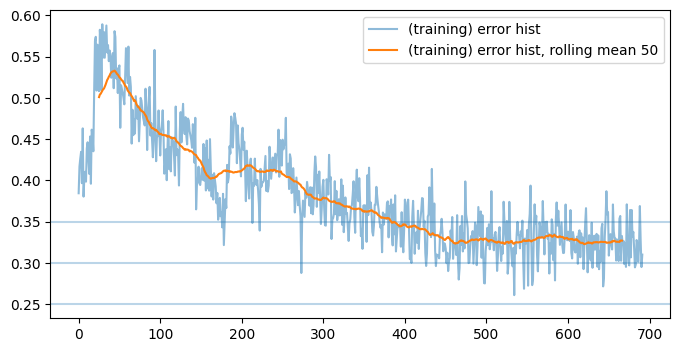

training batch  691
batches:  691
training batch  692
batches:  692
training batch  693
batches:  693
training batch  694
batches:  694
training batch  695
batches:  695
training batch  696
batches:  696
training batch  697
batches:  697
training batch  698
batches:  698
training batch  699
batches:  699
training batch  700
batches:  700


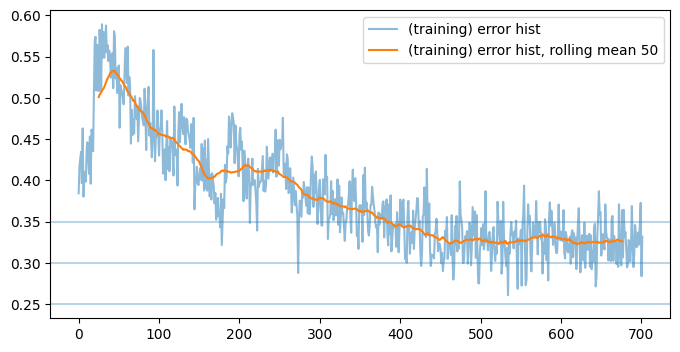

training batch  701
batches:  701
training batch  702
batches:  702
training batch  703
batches:  703
training batch  704
batches:  704
training batch  705
batches:  705
training batch  706
batches:  706
training batch  707
batches:  707
training batch  708
batches:  708
training batch  709
batches:  709
training batch  710
batches:  710


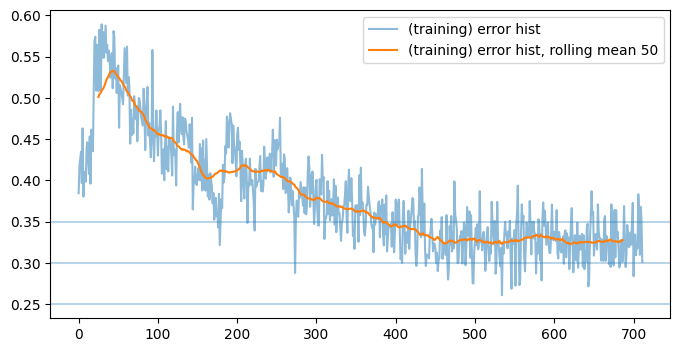

training batch  711
batches:  711
training batch  712
batches:  712
training batch  713
batches:  713
training batch  714
batches:  714
training batch  715
batches:  715
training batch  716
batches:  716
training batch  717
batches:  717
training batch  718
batches:  718
training batch  719
batches:  719
training batch  720
batches:  720


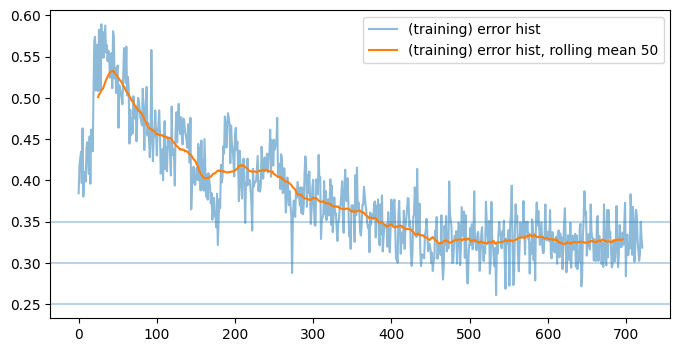

training batch  721
batches:  721
training batch  722
batches:  722
training batch  723
batches:  723
training batch  724
batches:  724
training batch  725
batches:  725
training batch  726
batches:  726
training batch  727
batches:  727
training batch  728
batches:  728
training batch  729
batches:  729
training batch  730
batches:  730


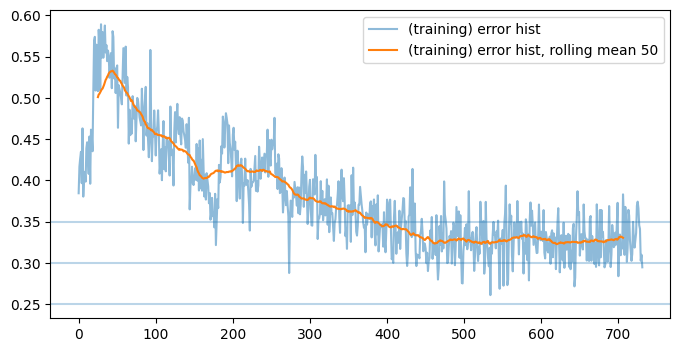

training batch  731
batches:  731
training batch  732
batches:  732
training batch  733
batches:  733
training batch  734
batches:  734
training batch  735
batches:  735
training batch  736
batches:  736
training batch  737
batches:  737
training batch  738
batches:  738
training batch  739
batches:  739
training batch  740
batches:  740


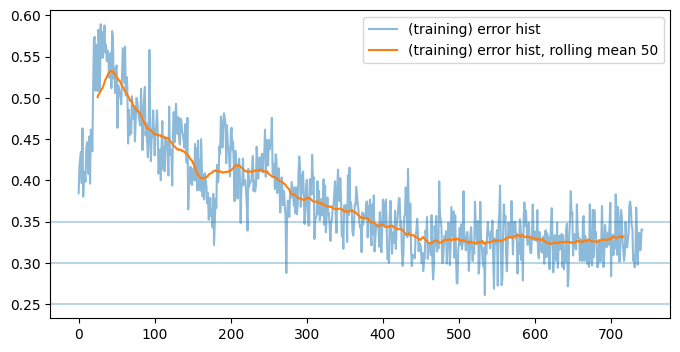

training batch  741
batches:  741
training batch  742
batches:  742
training batch  743
batches:  743
training batch  744
batches:  744
training batch  745
batches:  745
training batch  746
batches:  746
training batch  747
batches:  747
training batch  748
batches:  748
training batch  749
batches:  749
training batch  750
batches:  750


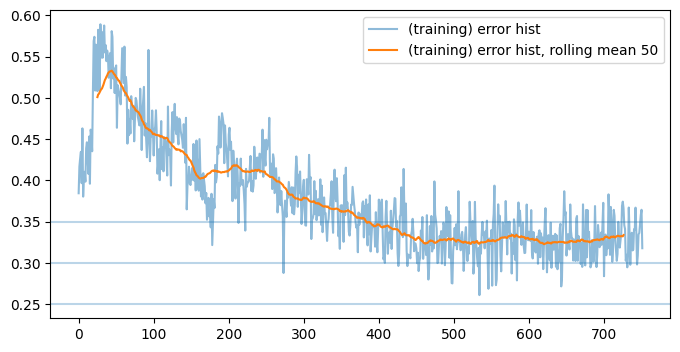

training batch  751
batches:  751
training batch  752
batches:  752
training batch  753
batches:  753
training batch  754
batches:  754
training batch  755
batches:  755
training batch  756
batches:  756
training batch  757
batches:  757
training batch  758
batches:  758
training batch  759
batches:  759
training batch  760
batches:  760


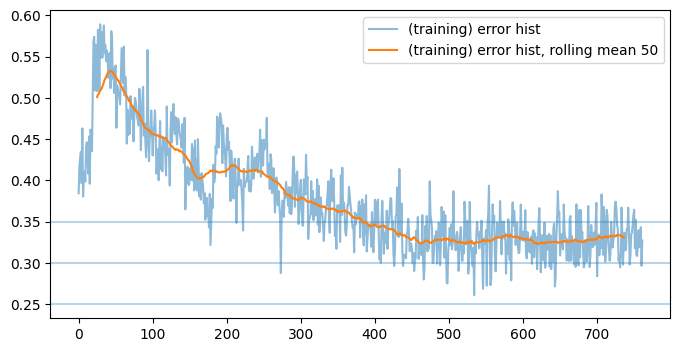

training batch  761
batches:  761
training batch  762
batches:  762
training batch  763
batches:  763
training batch  764
batches:  764
training batch  765
batches:  765
training batch  766
batches:  766
training batch  767
batches:  767
training batch  768
batches:  768
training batch  769
batches:  769
training batch  770
batches:  770


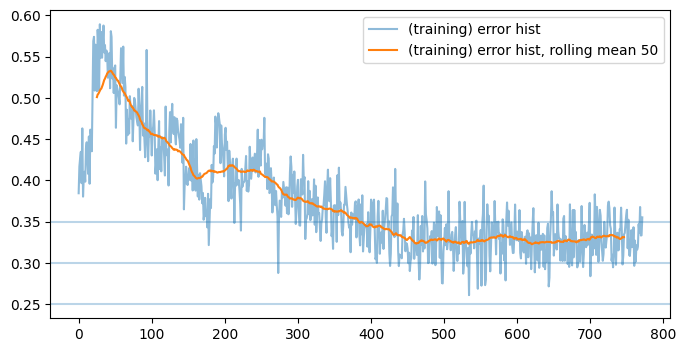

training batch  771
batches:  771
training batch  772
batches:  772
training batch  773
batches:  773
training batch  774
batches:  774
training batch  775
batches:  775
training batch  776
batches:  776
training batch  777
batches:  777
training batch  778
batches:  778
training batch  779
batches:  779
training batch  780
batches:  780


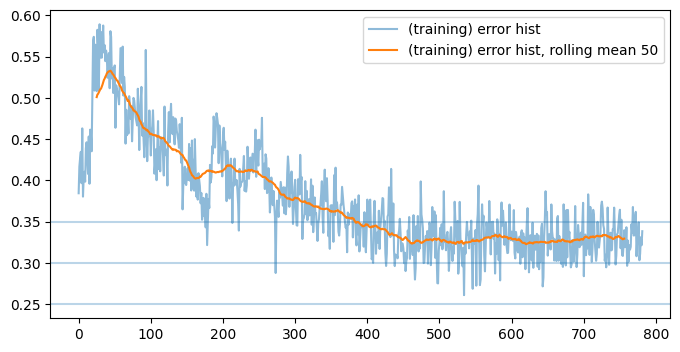

training batch  781
batches:  781
training batch  782
batches:  782
training batch  783
batches:  783
training batch  784
batches:  784
training batch  785
batches:  785
training batch  786
batches:  786
training batch  787
batches:  787
training batch  788
batches:  788
training batch  789
batches:  789
training batch  790
batches:  790


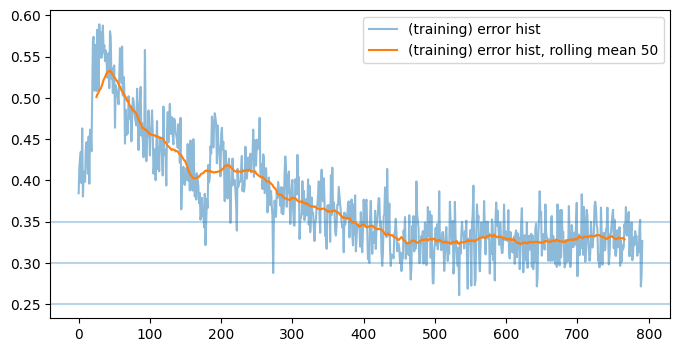

training batch  791
batches:  791
training batch  792
batches:  792
training batch  793
batches:  793
training batch  794
batches:  794
training batch  795
batches:  795
training batch  796
batches:  796
training batch  797
batches:  797
training batch  798
batches:  798
training batch  799
batches:  799
training batch  800
batches:  800


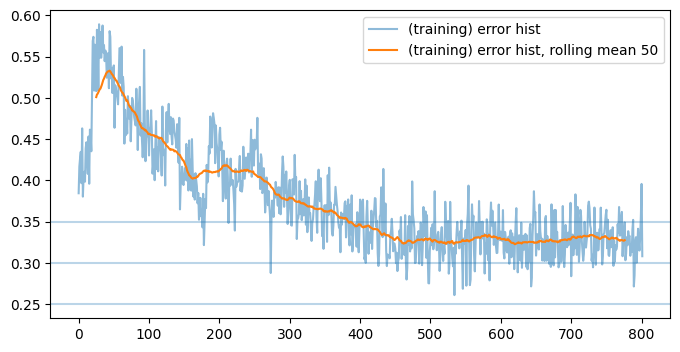

training batch  801
batches:  801
training batch  802
batches:  802
training batch  803
batches:  803
training batch  804
batches:  804
training batch  805
batches:  805
training batch  806
batches:  806
training batch  807
batches:  807
training batch  808
batches:  808
training batch  809
batches:  809
training batch  810
batches:  810


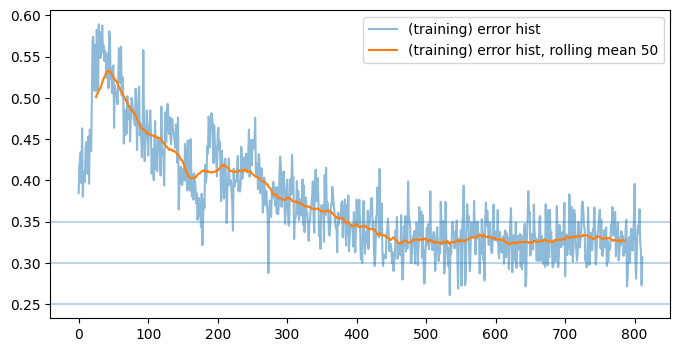

training batch  811
batches:  811
training batch  812
batches:  812
training batch  813
batches:  813
training batch  814
batches:  814
training batch  815
batches:  815
training batch  816
batches:  816
training batch  817
batches:  817
training batch  818
batches:  818
training batch  819
batches:  819
training batch  820
batches:  820


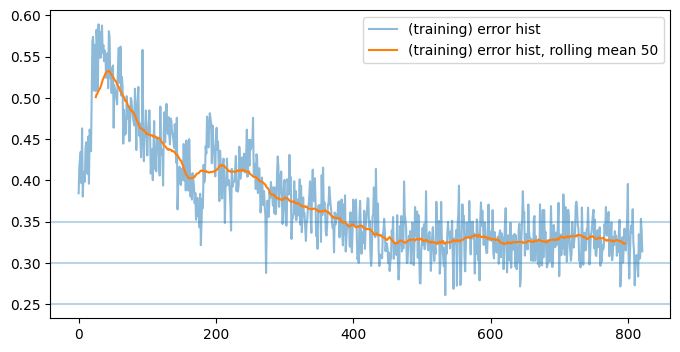

training batch  821
batches:  821
training batch  822
batches:  822
training batch  823
batches:  823
training batch  824
batches:  824
training batch  825
batches:  825
training batch  826
batches:  826
training batch  827
batches:  827
training batch  828
batches:  828
training batch  829
batches:  829
training batch  830
batches:  830


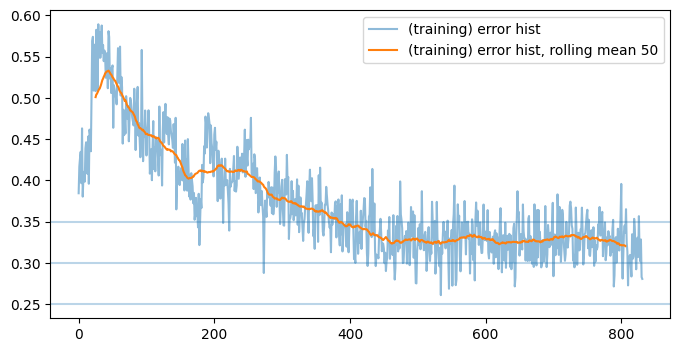

training batch  831
batches:  831
training batch  832
batches:  832
training batch  833
batches:  833
training batch  834
batches:  834
training batch  835
batches:  835
training batch  836
batches:  836
training batch  837
batches:  837
training batch  838
batches:  838
training batch  839
batches:  839
training batch  840
batches:  840


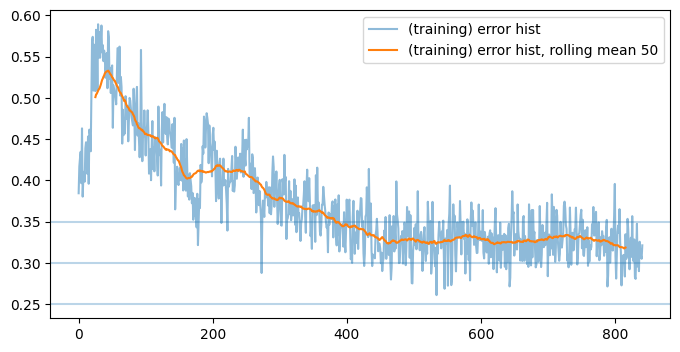

training batch  841
batches:  841
training batch  842
batches:  842
training batch  843
batches:  843
training batch  844
batches:  844
training batch  845
batches:  845
training batch  846
batches:  846
training batch  847
batches:  847
training batch  848
batches:  848
training batch  849
batches:  849
training batch  850
batches:  850


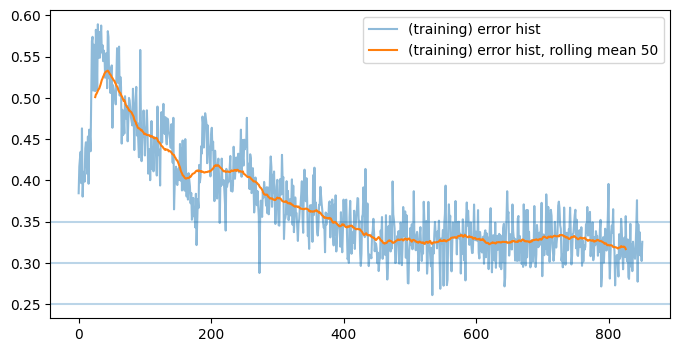

training batch  851
batches:  851
training batch  852
batches:  852
training batch  853
batches:  853
training batch  854
batches:  854
training batch  855
batches:  855
training batch  856
batches:  856
training batch  857
batches:  857
training batch  858
batches:  858
training batch  859
batches:  859
training batch  860
batches:  860


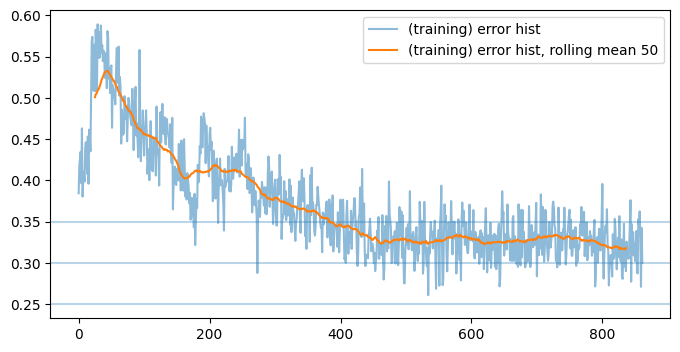

training batch  861
batches:  861
training batch  862
batches:  862
training batch  863
batches:  863
training batch  864
batches:  864
training batch  865
batches:  865
training batch  866
batches:  866
training batch  867
batches:  867
training batch  868
batches:  868
training batch  869
batches:  869
training batch  870
batches:  870


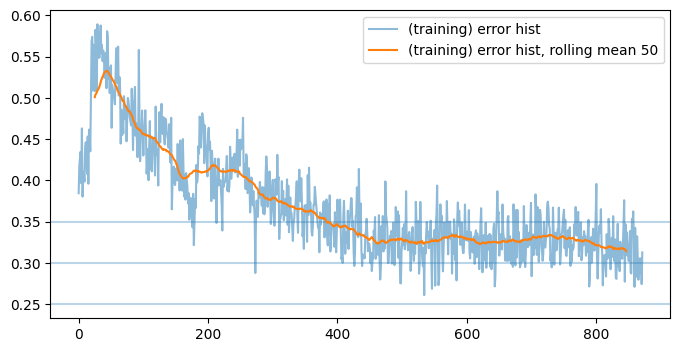

training batch  871
batches:  871
training batch  872
batches:  872
training batch  873
batches:  873
training batch  874
batches:  874
training batch  875
batches:  875
training batch  876
batches:  876
training batch  877
batches:  877
training batch  878
batches:  878
training batch  879
batches:  879
training batch  880
batches:  880


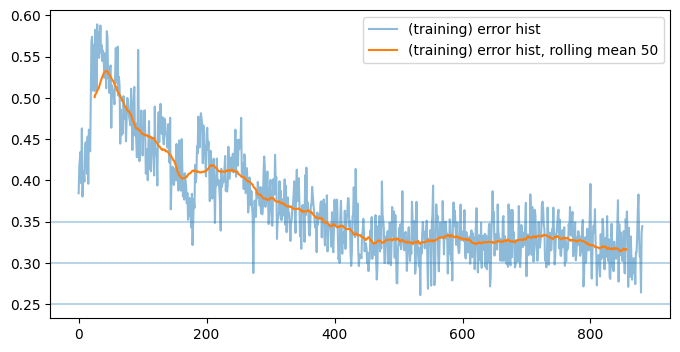

training batch  881
batches:  881
training batch  882
batches:  882
training batch  883
batches:  883
training batch  884
batches:  884
training batch  885
batches:  885
training batch  886
batches:  886
training batch  887
batches:  887
training batch  888
batches:  888
training batch  889
batches:  889
training batch  890
batches:  890


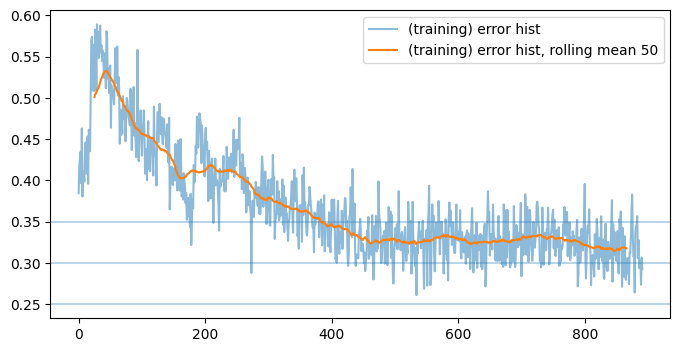

training batch  891
batches:  891
training batch  892
batches:  892
training batch  893
batches:  893
training batch  894
batches:  894
training batch  895
batches:  895
training batch  896
batches:  896
training batch  897
batches:  897
training batch  898
batches:  898
training batch  899
batches:  899
training batch  900
batches:  900


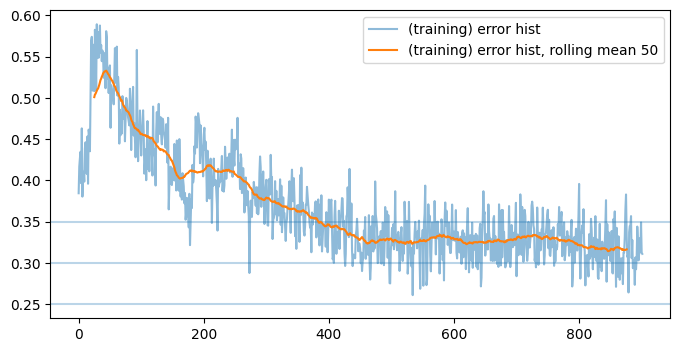

training batch  901
batches:  901
training batch  902
batches:  902
training batch  903
batches:  903
training batch  904
batches:  904
training batch  905
batches:  905
training batch  906
batches:  906
training batch  907
batches:  907
training batch  908
batches:  908
training batch  909
batches:  909
training batch  910
batches:  910


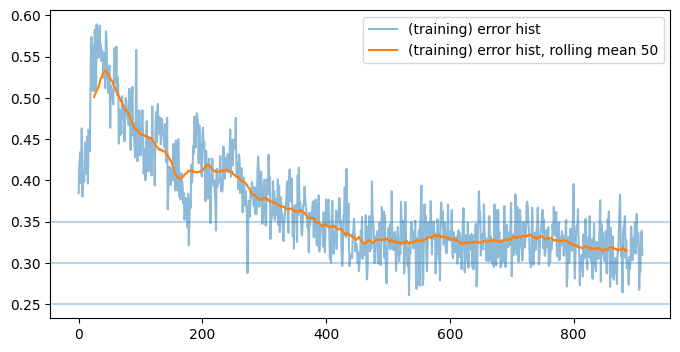

training batch  911
batches:  911
training batch  912
batches:  912
training batch  913
batches:  913
training batch  914
batches:  914
training batch  915
batches:  915
training batch  916
batches:  916
training batch  917
batches:  917
training batch  918
batches:  918
training batch  919
batches:  919
training batch  920
batches:  920


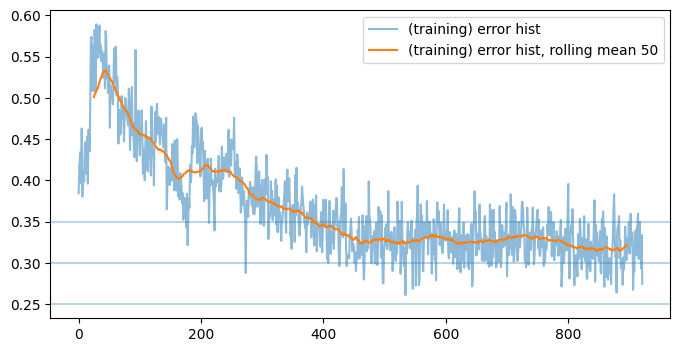

training batch  921
batches:  921
training batch  922
batches:  922
training batch  923
batches:  923
training batch  924
batches:  924
training batch  925
batches:  925
training batch  926
batches:  926
training batch  927
batches:  927
training batch  928
batches:  928
training batch  929
batches:  929
training batch  930
batches:  930


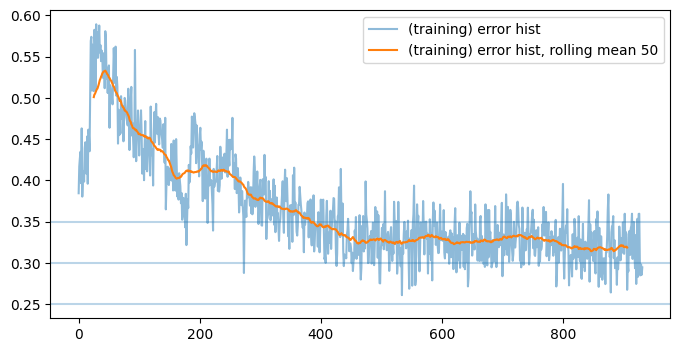

training batch  931
batches:  931
training batch  932
batches:  932
training batch  933
batches:  933
training batch  934
batches:  934
training batch  935
batches:  935
training batch  936
batches:  936
training batch  937
batches:  937
training batch  938
batches:  938
training batch  939
batches:  939
training batch  940
batches:  940


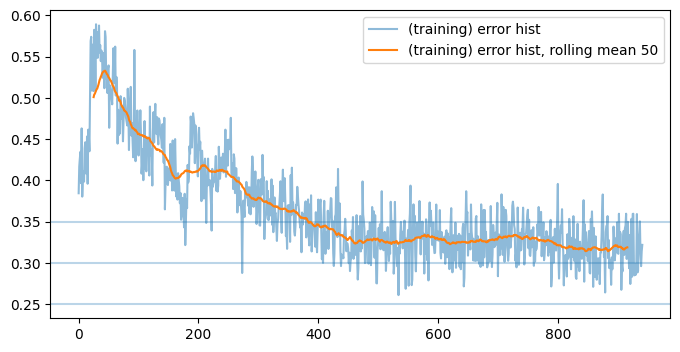

training batch  941
batches:  941
training batch  942
batches:  942
training batch  943
batches:  943
training batch  944
batches:  944
training batch  945
batches:  945
training batch  946
batches:  946
training batch  947
batches:  947
training batch  948
batches:  948
training batch  949
batches:  949
training batch  950
batches:  950


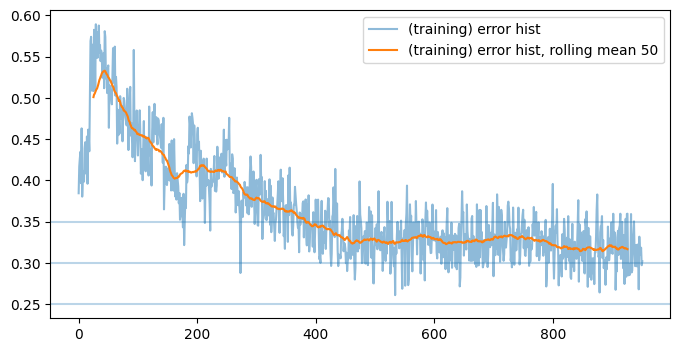

training batch  951
batches:  951
training batch  952
batches:  952
training batch  953
batches:  953
training batch  954
batches:  954
training batch  955
batches:  955
training batch  956
batches:  956
training batch  957
batches:  957
training batch  958
batches:  958
training batch  959
batches:  959
training batch  960
batches:  960


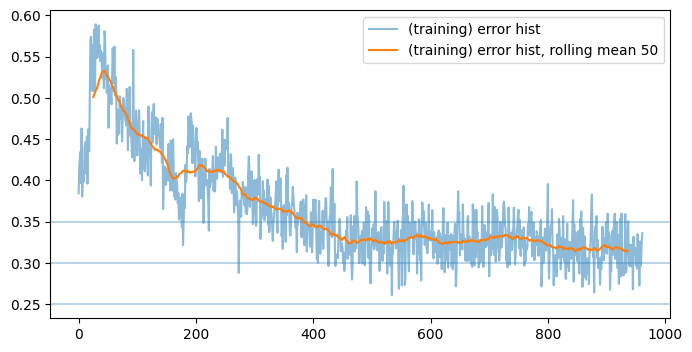

training batch  961
batches:  961
training batch  962
batches:  962
training batch  963
batches:  963
training batch  964
batches:  964
training batch  965
batches:  965
training batch  966
batches:  966
training batch  967
batches:  967
training batch  968
batches:  968
training batch  969
batches:  969
training batch  970
batches:  970


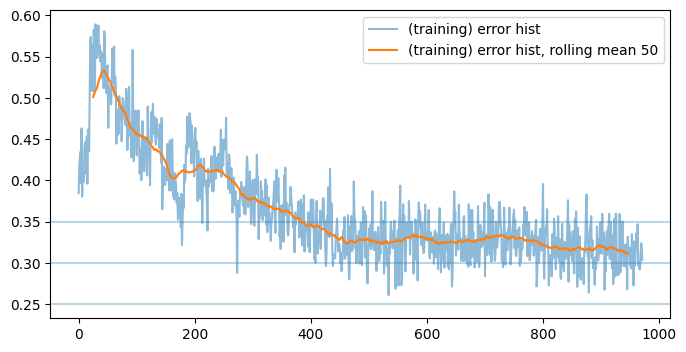

training batch  971
batches:  971
training batch  972
batches:  972
training batch  973
batches:  973
training batch  974
batches:  974
training batch  975
batches:  975
training batch  976
batches:  976
training batch  977
batches:  977
training batch  978
batches:  978
training batch  979
batches:  979
training batch  980
batches:  980


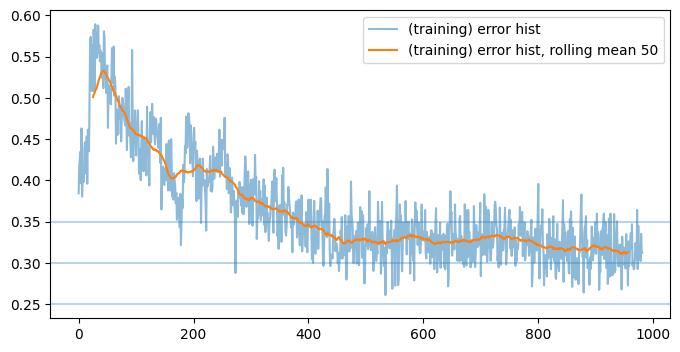

training batch  981
batches:  981
training batch  982
batches:  982
training batch  983
batches:  983
training batch  984
batches:  984
training batch  985
batches:  985
training batch  986
batches:  986
training batch  987
batches:  987
training batch  988
batches:  988
training batch  989
batches:  989
training batch  990
batches:  990


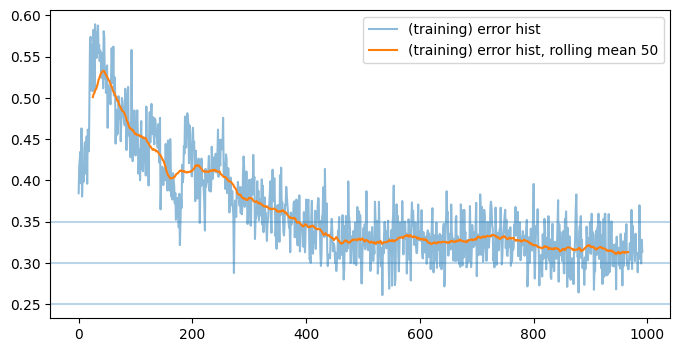

training batch  991
batches:  991
training batch  992
batches:  992
training batch  993
batches:  993
training batch  994
batches:  994
training batch  995
batches:  995
training batch  996
batches:  996
training batch  997
batches:  997
training batch  998
batches:  998
training batch  999
batches:  999
training batch  1000
batches:  1000


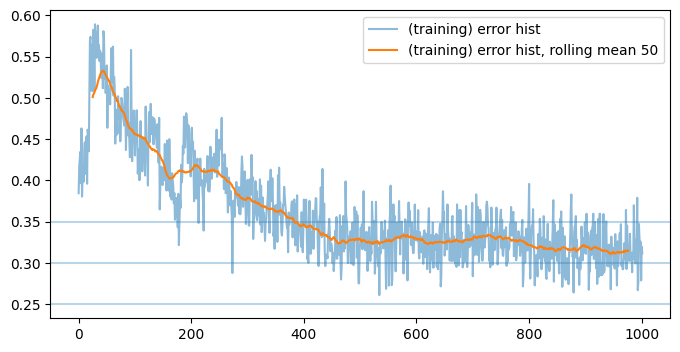

training batch  1001
batches:  1001
training batch  1002
batches:  1002
training batch  1003
batches:  1003
training batch  1004
batches:  1004
training batch  1005
batches:  1005
training batch  1006
batches:  1006
training batch  1007
batches:  1007
training batch  1008
batches:  1008
training batch  1009
batches:  1009
training batch  1010
batches:  1010


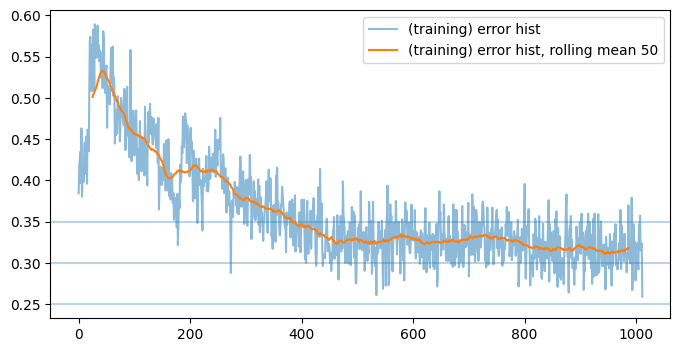

training batch  1011
batches:  1011
training batch  1012
batches:  1012
training batch  1013
batches:  1013
training batch  1014
batches:  1014
training batch  1015
batches:  1015
training batch  1016
batches:  1016
training batch  1017
batches:  1017
training batch  1018
batches:  1018
training batch  1019
batches:  1019
training batch  1020
batches:  1020


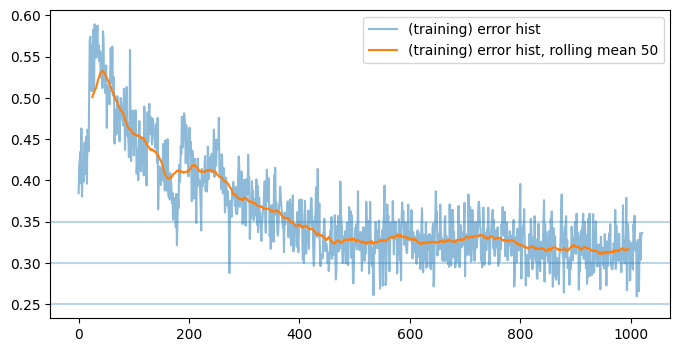

training batch  1021
batches:  1021
training batch  1022
batches:  1022
training batch  1023
batches:  1023
training batch  1024
batches:  1024
training batch  1025
batches:  1025
training batch  1026
batches:  1026
training batch  1027
batches:  1027
training batch  1028
batches:  1028
training batch  1029
batches:  1029
training batch  1030
batches:  1030


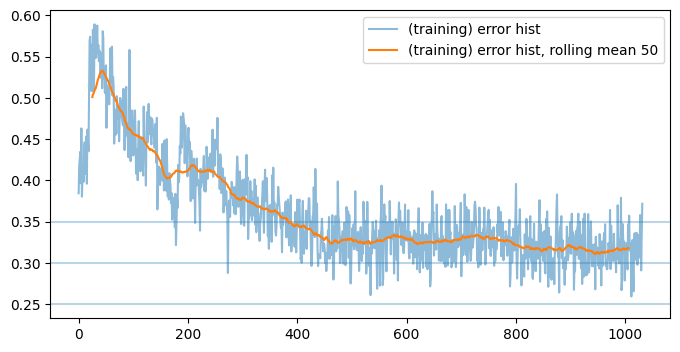

training batch  1031
batches:  1031
training batch  1032
batches:  1032
training batch  1033
batches:  1033
training batch  1034
batches:  1034
training batch  1035
batches:  1035
training batch  1036
batches:  1036
training batch  1037
batches:  1037
training batch  1038
batches:  1038
training batch  1039
batches:  1039
training batch  1040
batches:  1040


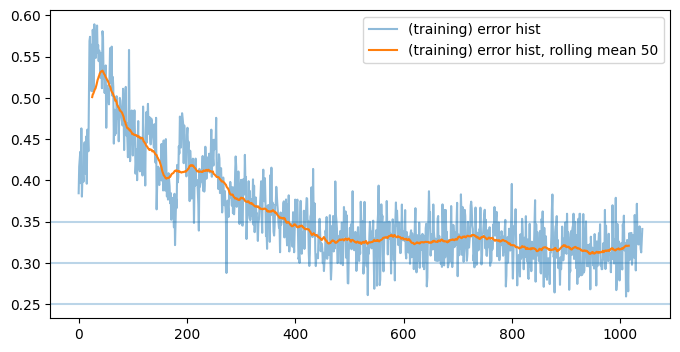

training batch  1041
batches:  1041
training batch  1042
batches:  1042
training batch  1043
batches:  1043
training batch  1044
batches:  1044
training batch  1045
batches:  1045
training batch  1046
batches:  1046
training batch  1047
batches:  1047
training batch  1048
batches:  1048
training batch  1049
batches:  1049
training batch  1050
batches:  1050


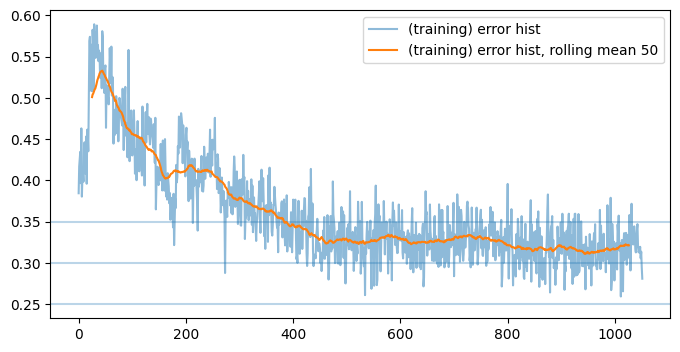

training batch  1051
batches:  1051
training batch  1052
batches:  1052
training batch  1053
batches:  1053
training batch  1054
batches:  1054
training batch  1055
batches:  1055
training batch  1056
batches:  1056
training batch  1057
batches:  1057
training batch  1058
batches:  1058
training batch  1059
batches:  1059
training batch  1060
batches:  1060


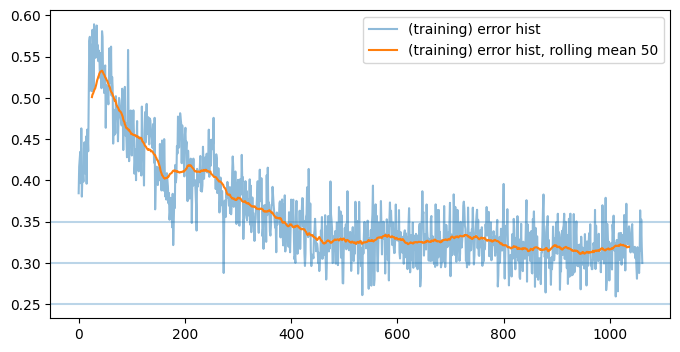

training batch  1061
batches:  1061
training batch  1062
batches:  1062
training batch  1063
batches:  1063
training batch  1064
batches:  1064
training batch  1065
batches:  1065
training batch  1066
batches:  1066
training batch  1067
batches:  1067
training batch  1068
batches:  1068
training batch  1069
batches:  1069
training batch  1070
batches:  1070


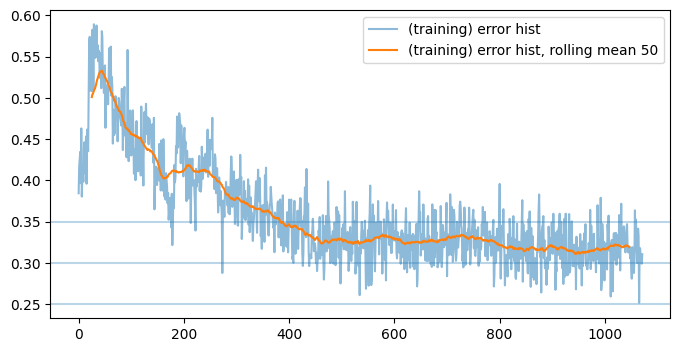

training batch  1071
batches:  1071
training batch  1072
batches:  1072
training batch  1073
batches:  1073
training batch  1074
batches:  1074
training batch  1075
batches:  1075
training batch  1076
batches:  1076
training batch  1077
batches:  1077
training batch  1078
batches:  1078
training batch  1079
batches:  1079
training batch  1080
batches:  1080


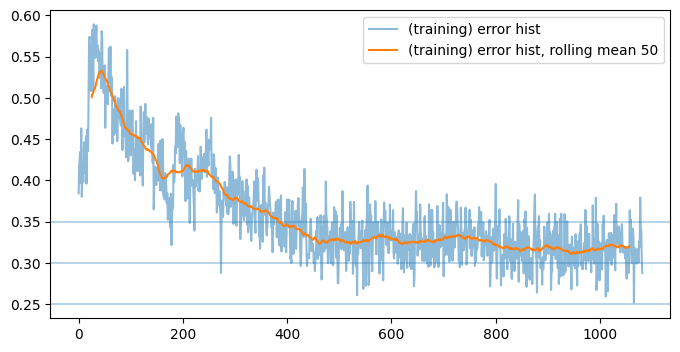

training batch  1081
batches:  1081
training batch  1082
batches:  1082
training batch  1083
batches:  1083
training batch  1084
batches:  1084
training batch  1085
batches:  1085
training batch  1086
batches:  1086
training batch  1087
batches:  1087
training batch  1088
batches:  1088
training batch  1089
batches:  1089
training batch  1090
batches:  1090


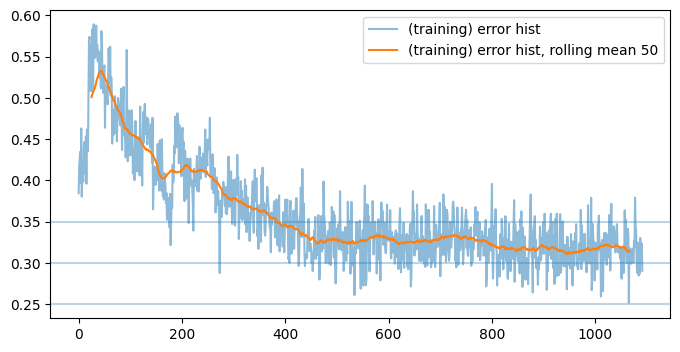

training batch  1091
batches:  1091
training batch  1092
batches:  1092
training batch  1093
batches:  1093
training batch  1094
batches:  1094
training batch  1095
batches:  1095
training batch  1096
batches:  1096
training batch  1097
batches:  1097
training batch  1098
batches:  1098
training batch  1099
batches:  1099
training batch  1100
batches:  1100


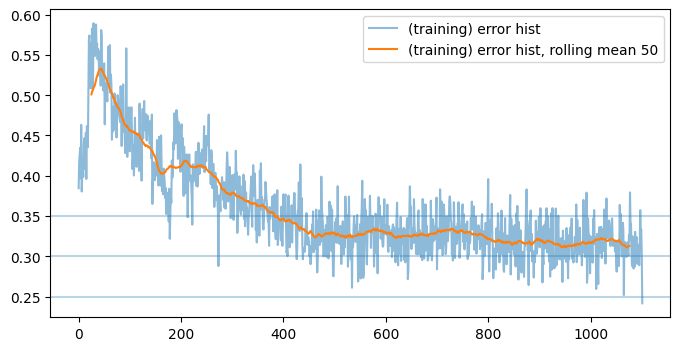

training batch  1101
batches:  1101
training batch  1102
batches:  1102
training batch  1103
batches:  1103
training batch  1104
batches:  1104
training batch  1105
batches:  1105
training batch  1106
batches:  1106
training batch  1107
batches:  1107
training batch  1108
batches:  1108
training batch  1109
batches:  1109
training batch  1110
batches:  1110


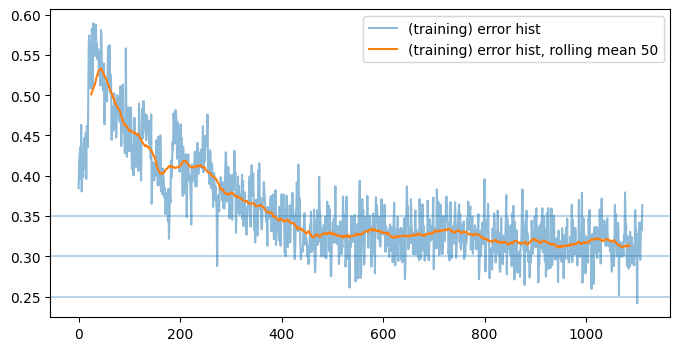

training batch  1111
batches:  1111
training batch  1112
batches:  1112
training batch  1113
batches:  1113
training batch  1114
batches:  1114
training batch  1115
batches:  1115
training batch  1116
batches:  1116
training batch  1117
batches:  1117
training batch  1118
batches:  1118
training batch  1119
batches:  1119
training batch  1120
batches:  1120


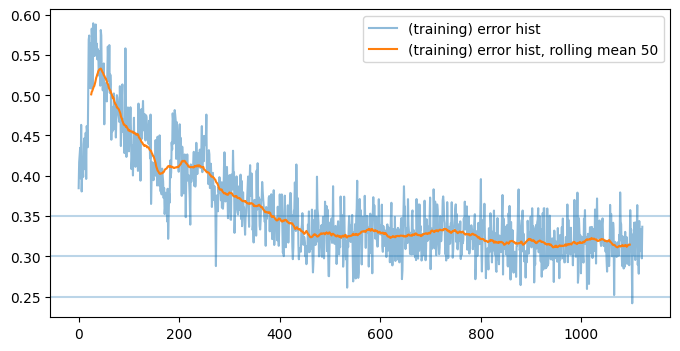

training batch  1121
batches:  1121
training batch  1122
batches:  1122
training batch  1123
batches:  1123
training batch  1124
batches:  1124
training batch  1125
batches:  1125
training batch  1126
batches:  1126
training batch  1127
batches:  1127
training batch  1128
batches:  1128
training batch  1129
batches:  1129
training batch  1130
batches:  1130


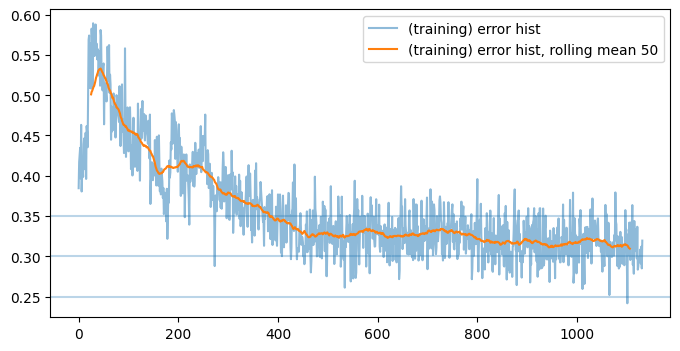

training batch  1131
batches:  1131
training batch  1132
batches:  1132
training batch  1133
batches:  1133
training batch  1134
batches:  1134
training batch  1135
batches:  1135
training batch  1136
batches:  1136
training batch  1137
batches:  1137
training batch  1138
batches:  1138
training batch  1139
batches:  1139
training batch  1140
batches:  1140


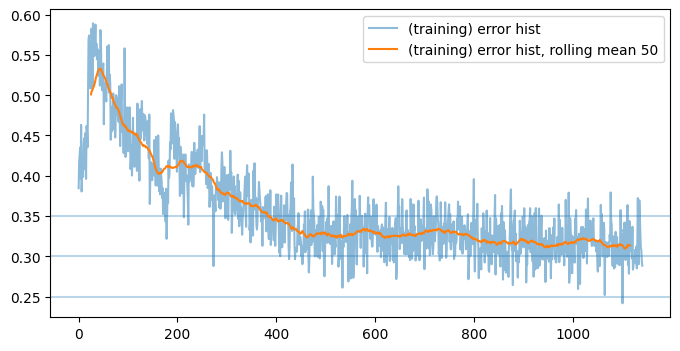

training batch  1141
batches:  1141
training batch  1142
batches:  1142
training batch  1143
batches:  1143
training batch  1144
batches:  1144
training batch  1145
batches:  1145
training batch  1146
batches:  1146
training batch  1147
batches:  1147
training batch  1148
batches:  1148
training batch  1149
batches:  1149
training batch  1150
batches:  1150


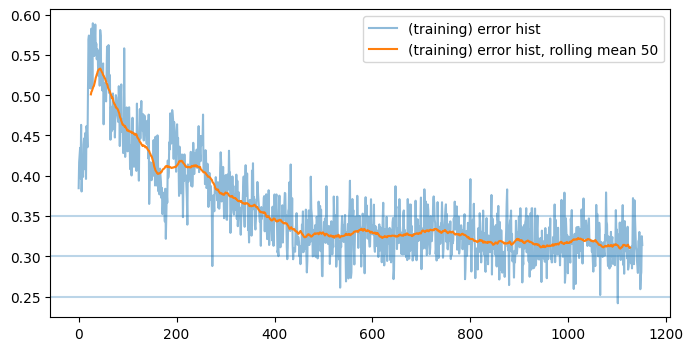

training batch  1151
batches:  1151
training batch  1152
batches:  1152
training batch  1153
batches:  1153
training batch  1154
batches:  1154
training batch  1155
batches:  1155
training batch  1156
batches:  1156
training batch  1157
batches:  1157
training batch  1158
batches:  1158
training batch  1159
batches:  1159
training batch  1160
batches:  1160


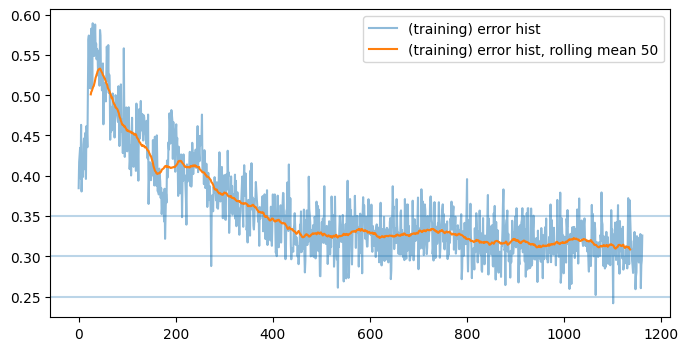

training batch  1161
batches:  1161
training batch  1162
batches:  1162
training batch  1163
batches:  1163
training batch  1164
batches:  1164
training batch  1165
batches:  1165
training batch  1166
batches:  1166
training batch  1167
batches:  1167
training batch  1168
batches:  1168
training batch  1169
batches:  1169
training batch  1170
batches:  1170


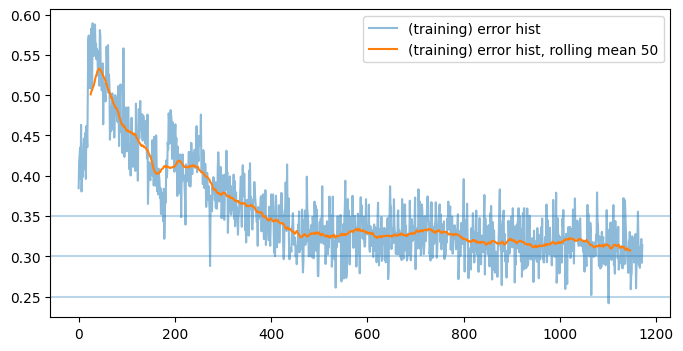

training batch  1171
batches:  1171
training batch  1172
batches:  1172
training batch  1173
batches:  1173
training batch  1174
batches:  1174
training batch  1175
batches:  1175
training batch  1176
batches:  1176
training batch  1177
batches:  1177
training batch  1178
batches:  1178
training batch  1179
batches:  1179
training batch  1180
batches:  1180


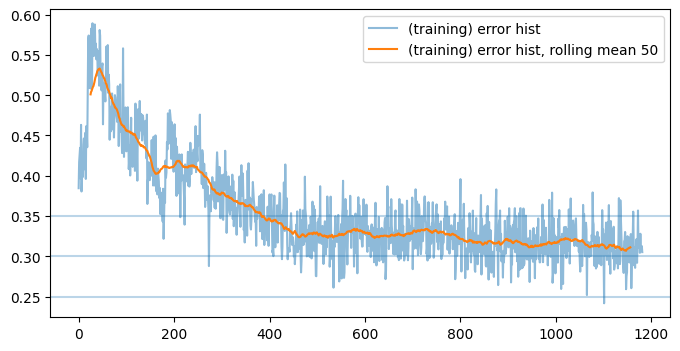

training batch  1181
batches:  1181
training batch  1182
batches:  1182
training batch  1183
batches:  1183
training batch  1184
batches:  1184
training batch  1185
batches:  1185
training batch  1186
batches:  1186
training batch  1187
batches:  1187
training batch  1188
batches:  1188
training batch  1189
batches:  1189
training batch  1190
batches:  1190


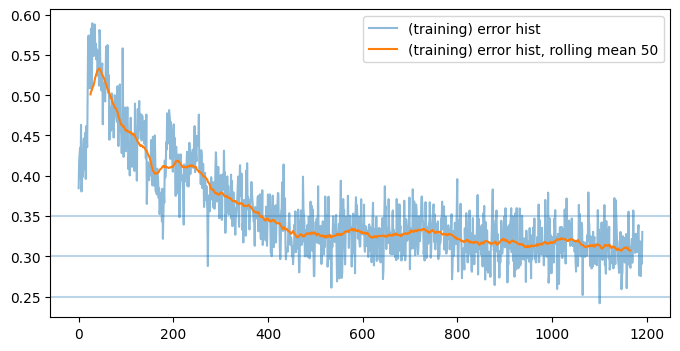

training batch  1191
batches:  1191
training batch  1192
batches:  1192
training batch  1193
batches:  1193
training batch  1194
batches:  1194
training batch  1195
batches:  1195
training batch  1196
batches:  1196
training batch  1197
batches:  1197
training batch  1198
batches:  1198
training batch  1199
batches:  1199
training batch  1200
batches:  1200


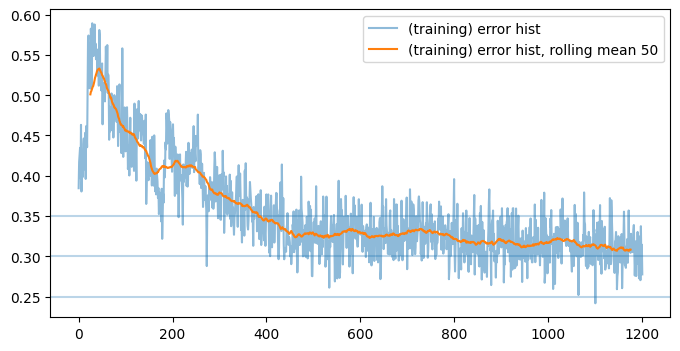

training batch  1201
batches:  1201
training batch  1202
batches:  1202
training batch  1203
batches:  1203
training batch  1204
batches:  1204
training batch  1205
batches:  1205
training batch  1206
batches:  1206
training batch  1207
batches:  1207
training batch  1208
batches:  1208
training batch  1209
batches:  1209
training batch  1210
batches:  1210


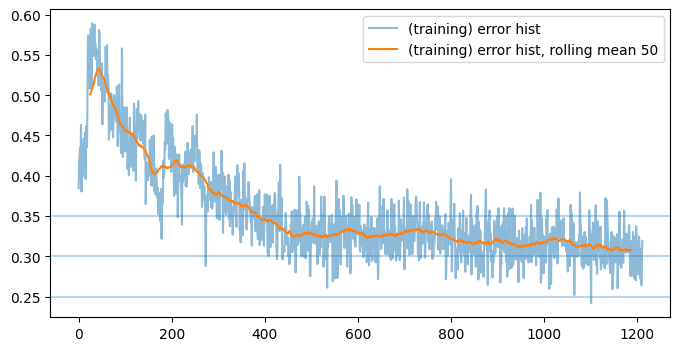

training batch  1211
batches:  1211
training batch  1212
batches:  1212
training batch  1213
batches:  1213
training batch  1214
batches:  1214
training batch  1215
batches:  1215
training batch  1216
batches:  1216
training batch  1217
batches:  1217
training batch  1218
batches:  1218
training batch  1219
batches:  1219
training batch  1220
batches:  1220


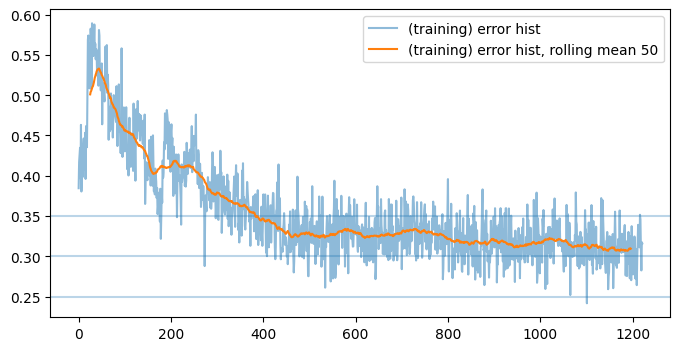

training batch  1221
batches:  1221
training batch  1222
batches:  1222
training batch  1223
batches:  1223
training batch  1224
batches:  1224
training batch  1225
batches:  1225
training batch  1226
batches:  1226
training batch  1227
batches:  1227
training batch  1228
batches:  1228
training batch  1229
batches:  1229
training batch  1230
batches:  1230


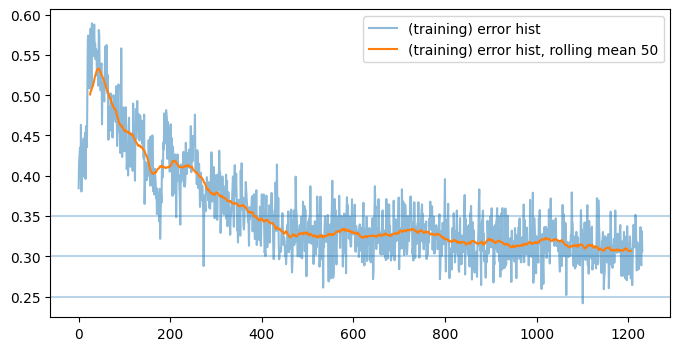

training batch  1231
batches:  1231
training batch  1232
batches:  1232
training batch  1233
batches:  1233
training batch  1234
batches:  1234
training batch  1235
batches:  1235
training batch  1236
batches:  1236
training batch  1237
batches:  1237
training batch  1238
batches:  1238
training batch  1239
batches:  1239
training batch  1240
batches:  1240


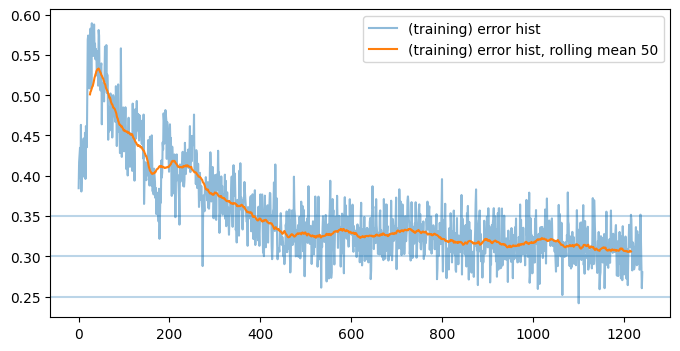

training batch  1241
batches:  1241
training batch  1242
batches:  1242
training batch  1243
batches:  1243
training batch  1244
batches:  1244
training batch  1245
batches:  1245
training batch  1246
batches:  1246
training batch  1247
batches:  1247
training batch  1248
batches:  1248
training batch  1249
batches:  1249
training batch  1250
batches:  1250


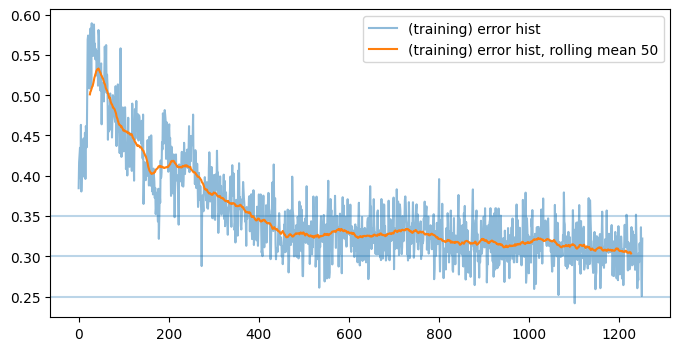

training batch  1251
batches:  1251
training batch  1252
batches:  1252
training batch  1253
batches:  1253
training batch  1254
batches:  1254
training batch  1255
batches:  1255
training batch  1256
batches:  1256
training batch  1257
batches:  1257
training batch  1258
batches:  1258
training batch  1259
batches:  1259
training batch  1260
batches:  1260


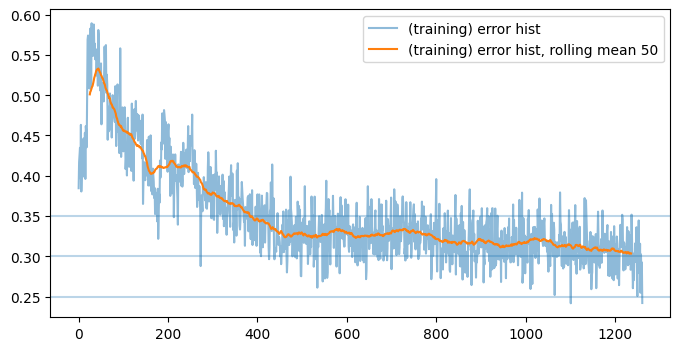

training batch  1261
batches:  1261
training batch  1262
batches:  1262
training batch  1263
batches:  1263
training batch  1264
batches:  1264
training batch  1265
batches:  1265
training batch  1266
batches:  1266
training batch  1267
batches:  1267
training batch  1268
batches:  1268
training batch  1269
batches:  1269
training batch  1270
batches:  1270


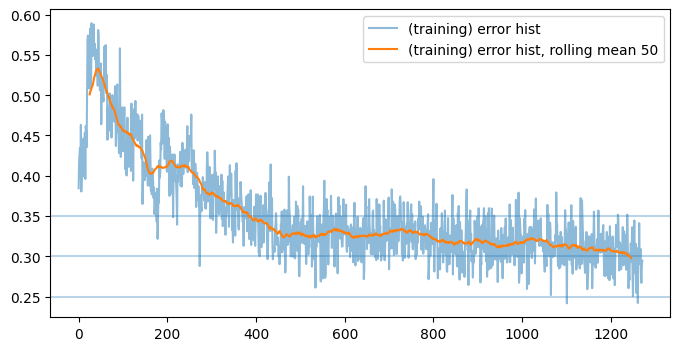

training batch  1271
batches:  1271
training batch  1272
batches:  1272
training batch  1273
batches:  1273
training batch  1274
batches:  1274
training batch  1275
batches:  1275
training batch  1276
batches:  1276
training batch  1277
batches:  1277
training batch  1278
batches:  1278
training batch  1279
batches:  1279
training batch  1280
batches:  1280


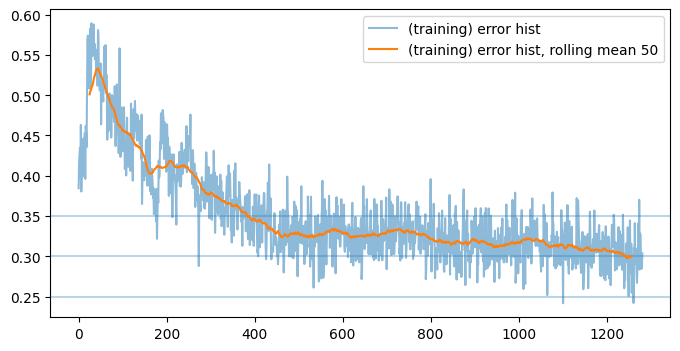

training batch  1281
batches:  1281
training batch  1282
batches:  1282
training batch  1283
batches:  1283
training batch  1284
batches:  1284
training batch  1285
batches:  1285
training batch  1286
batches:  1286
training batch  1287
batches:  1287
training batch  1288
batches:  1288
training batch  1289
batches:  1289
training batch  1290
batches:  1290


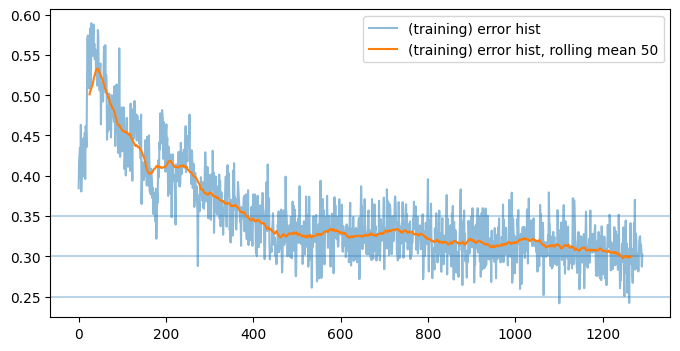

training batch  1291
batches:  1291
training batch  1292
batches:  1292
training batch  1293
batches:  1293
training batch  1294
batches:  1294
training batch  1295
batches:  1295
training batch  1296
batches:  1296
training batch  1297
batches:  1297
training batch  1298
batches:  1298
training batch  1299
batches:  1299
training batch  1300
batches:  1300


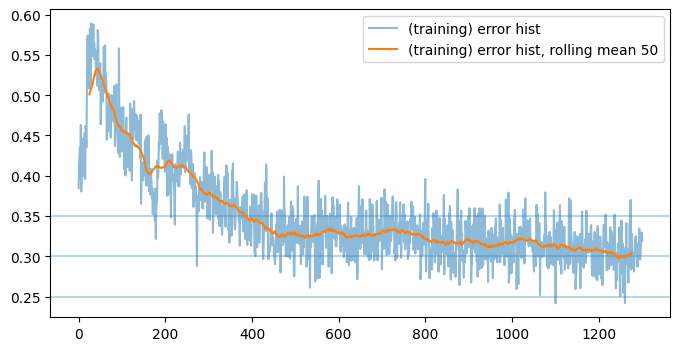

training batch  1301
batches:  1301
training batch  1302
batches:  1302
training batch  1303
batches:  1303
training batch  1304
batches:  1304
training batch  1305
batches:  1305
training batch  1306
batches:  1306
training batch  1307
batches:  1307
training batch  1308
batches:  1308
training batch  1309
batches:  1309
training batch  1310
batches:  1310


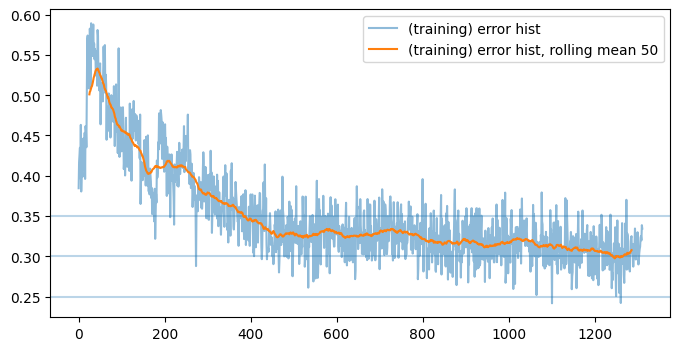

training batch  1311
batches:  1311
training batch  1312
batches:  1312
training batch  1313
batches:  1313
training batch  1314
batches:  1314
training batch  1315
batches:  1315
training batch  1316
batches:  1316
training batch  1317
batches:  1317
training batch  1318
batches:  1318
training batch  1319
batches:  1319
training batch  1320
batches:  1320


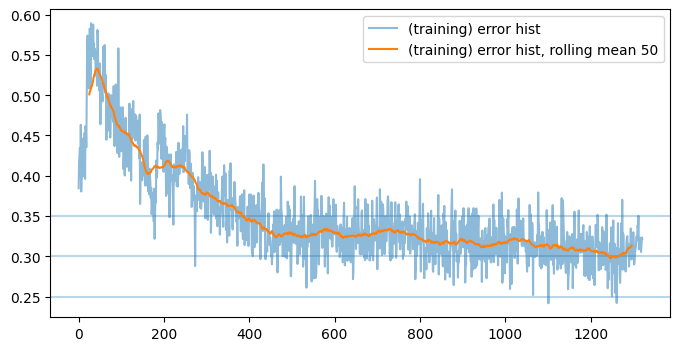

training batch  1321
batches:  1321
training batch  1322
batches:  1322
training batch  1323
batches:  1323
training batch  1324
batches:  1324
training batch  1325
batches:  1325
training batch  1326
batches:  1326
training batch  1327
batches:  1327
training batch  1328
batches:  1328
training batch  1329
batches:  1329
training batch  1330
batches:  1330


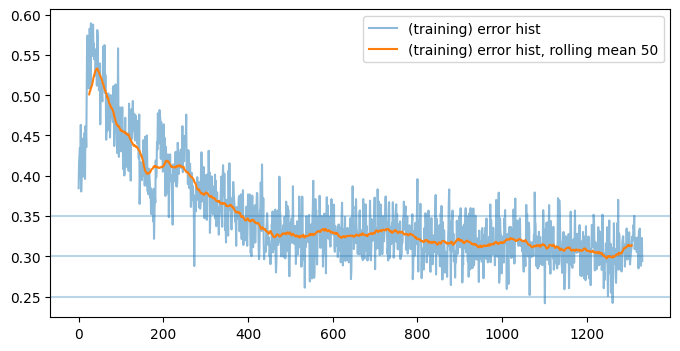

training batch  1331
batches:  1331
training batch  1332
batches:  1332
training batch  1333
batches:  1333
training batch  1334
batches:  1334
training batch  1335
batches:  1335
training batch  1336
batches:  1336
training batch  1337
batches:  1337
training batch  1338
batches:  1338
training batch  1339
batches:  1339
training batch  1340
batches:  1340


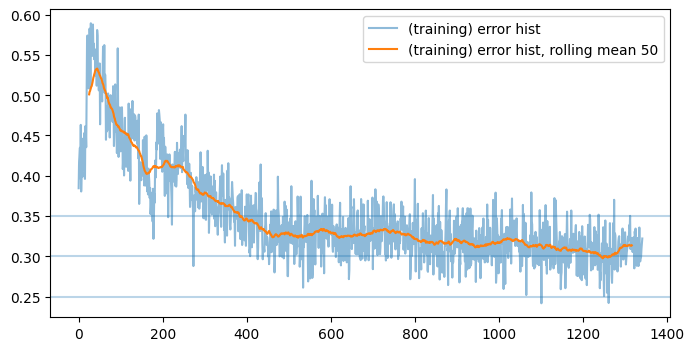

training batch  1341
batches:  1341
training batch  1342
batches:  1342
training batch  1343
batches:  1343
training batch  1344
batches:  1344
training batch  1345
batches:  1345
training batch  1346
batches:  1346
training batch  1347
batches:  1347
training batch  1348
batches:  1348
training batch  1349
batches:  1349
training batch  1350
batches:  1350


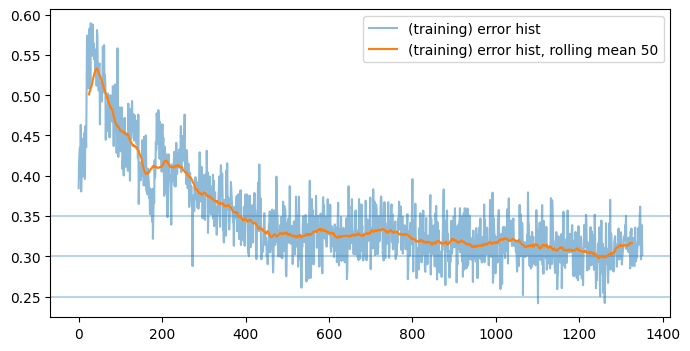

training batch  1351
batches:  1351
training batch  1352
batches:  1352
training batch  1353
batches:  1353
training batch  1354
batches:  1354
training batch  1355
batches:  1355
training batch  1356
batches:  1356
training batch  1357
batches:  1357
training batch  1358
batches:  1358
training batch  1359
batches:  1359
training batch  1360
batches:  1360


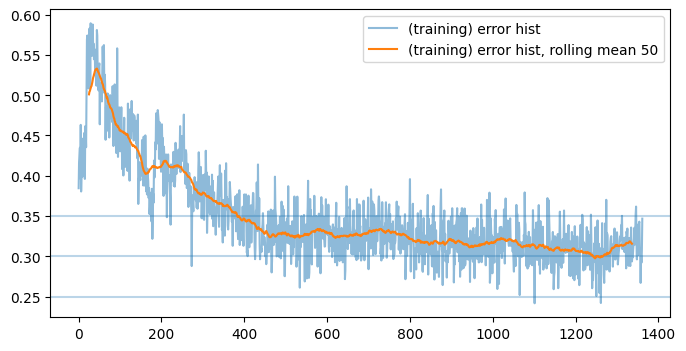

training batch  1361
batches:  1361
training batch  1362
batches:  1362
training batch  1363
batches:  1363
training batch  1364
batches:  1364
training batch  1365
batches:  1365
training batch  1366
batches:  1366
training batch  1367
batches:  1367
training batch  1368
batches:  1368
training batch  1369
batches:  1369
training batch  1370
batches:  1370


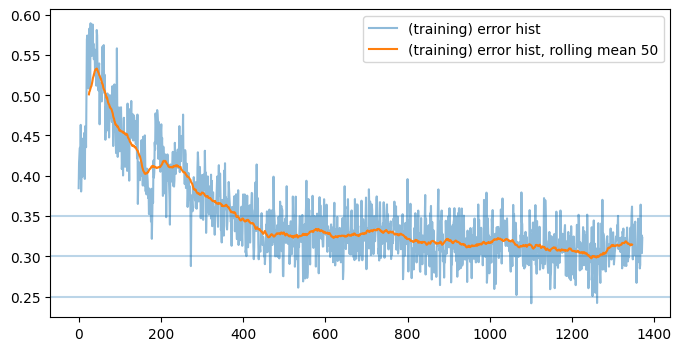

training batch  1371
batches:  1371
training batch  1372
batches:  1372
training batch  1373
batches:  1373
training batch  1374
batches:  1374
training batch  1375
batches:  1375
training batch  1376
batches:  1376
training batch  1377
batches:  1377
training batch  1378
batches:  1378
training batch  1379
batches:  1379
training batch  1380
batches:  1380


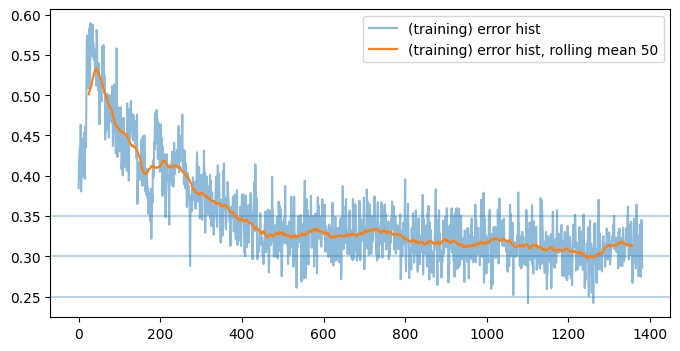

training batch  1381
batches:  1381
training batch  1382
batches:  1382
training batch  1383
batches:  1383
training batch  1384
batches:  1384
training batch  1385
batches:  1385
training batch  1386
batches:  1386
training batch  1387
batches:  1387
training batch  1388
batches:  1388
training batch  1389
batches:  1389
training batch  1390
batches:  1390


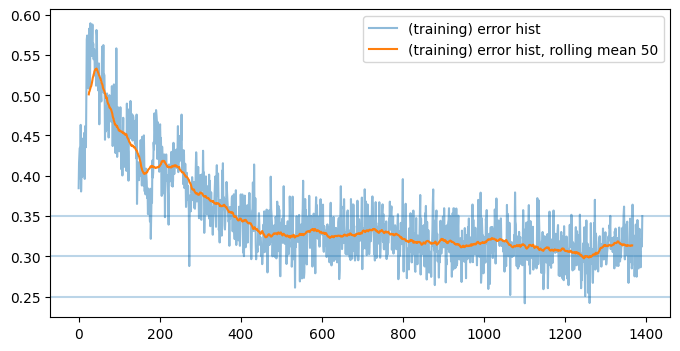

training batch  1391
batches:  1391
training batch  1392
batches:  1392
training batch  1393
batches:  1393
training batch  1394
batches:  1394
training batch  1395
batches:  1395
training batch  1396
batches:  1396
training batch  1397
batches:  1397
training batch  1398
batches:  1398
training batch  1399
batches:  1399
training batch  1400
batches:  1400


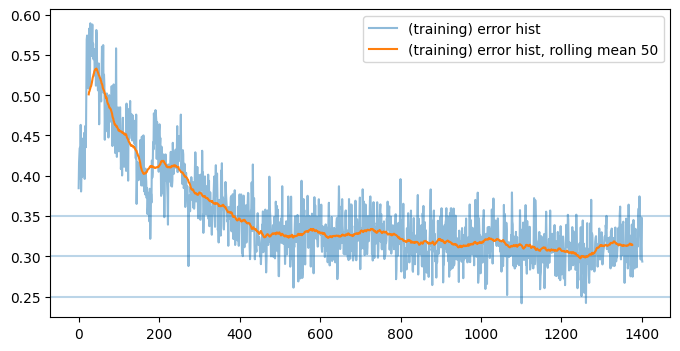

training batch  1401
batches:  1401
training batch  1402
batches:  1402
training batch  1403
batches:  1403
training batch  1404
batches:  1404
training batch  1405
batches:  1405
training batch  1406
batches:  1406
training batch  1407
batches:  1407
training batch  1408
batches:  1408
training batch  1409
batches:  1409
training batch  1410
batches:  1410


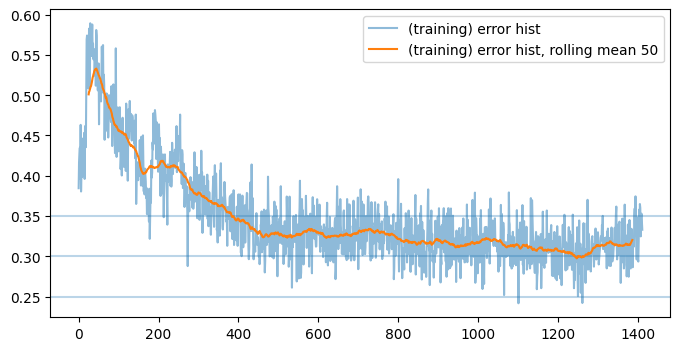

training batch  1411
batches:  1411
training batch  1412
batches:  1412
training batch  1413
batches:  1413
training batch  1414
batches:  1414
training batch  1415
batches:  1415
training batch  1416
batches:  1416
training batch  1417
batches:  1417
training batch  1418
batches:  1418
training batch  1419
batches:  1419
training batch  1420
batches:  1420


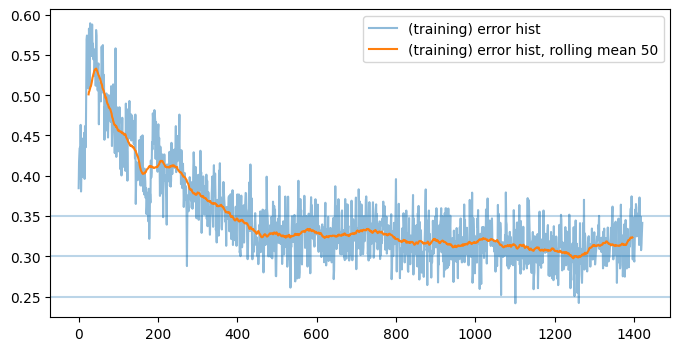

training batch  1421
batches:  1421
training batch  1422
batches:  1422
training batch  1423
batches:  1423
training batch  1424
batches:  1424
training batch  1425
batches:  1425
training batch  1426
batches:  1426
training batch  1427
batches:  1427
training batch  1428
batches:  1428
training batch  1429
batches:  1429
training batch  1430
batches:  1430


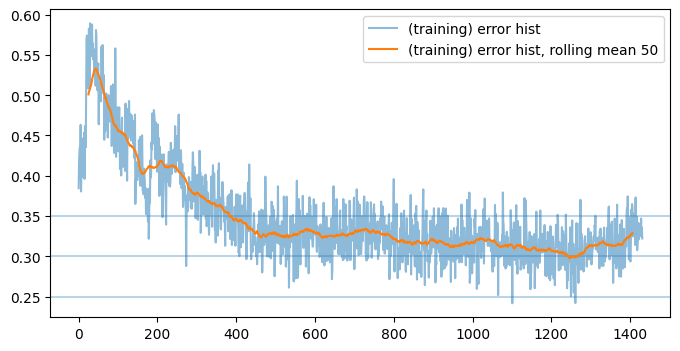

training batch  1431
batches:  1431
training batch  1432
batches:  1432
training batch  1433
batches:  1433
training batch  1434
batches:  1434
training batch  1435
batches:  1435
training batch  1436
batches:  1436
training batch  1437
batches:  1437
training batch  1438
batches:  1438
training batch  1439
batches:  1439
training batch  1440
batches:  1440


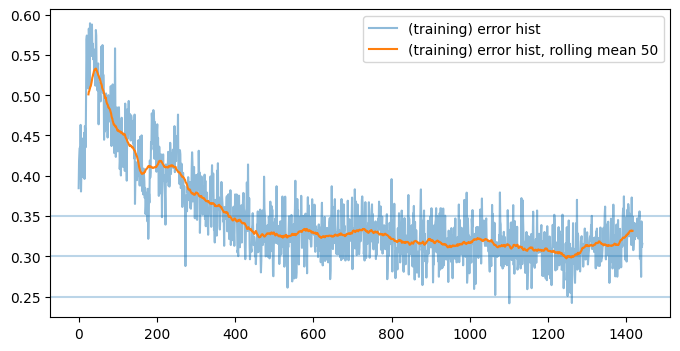

training batch  1441
batches:  1441
training batch  1442
batches:  1442
training batch  1443
batches:  1443
training batch  1444
batches:  1444
training batch  1445
batches:  1445
training batch  1446
batches:  1446
training batch  1447
batches:  1447
training batch  1448
batches:  1448
training batch  1449
batches:  1449
training batch  1450
batches:  1450


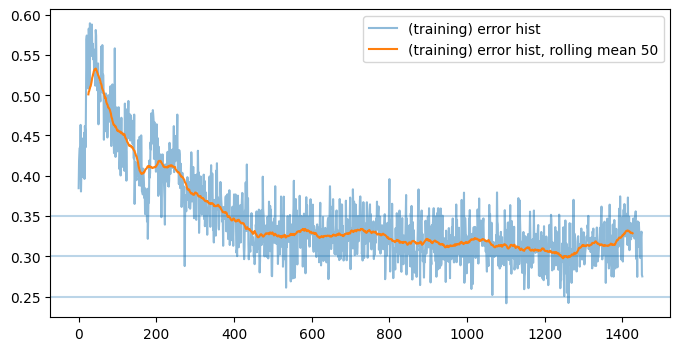

training batch  1451
batches:  1451
training batch  1452
batches:  1452
training batch  1453
batches:  1453
training batch  1454
batches:  1454
training batch  1455
batches:  1455
training batch  1456
batches:  1456
training batch  1457
batches:  1457
training batch  1458
batches:  1458
training batch  1459
batches:  1459
training batch  1460
batches:  1460


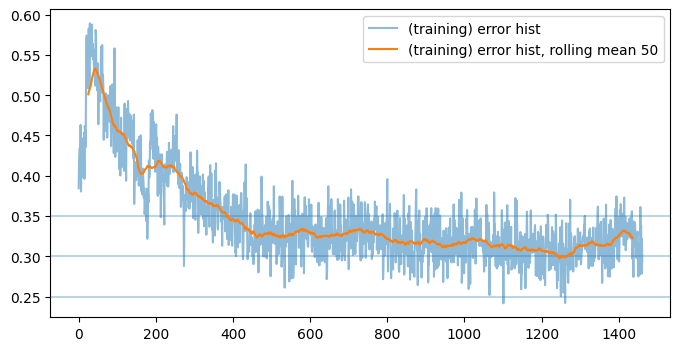

training batch  1461
batches:  1461
training batch  1462
batches:  1462
training batch  1463
batches:  1463
training batch  1464
batches:  1464
training batch  1465
batches:  1465
training batch  1466
batches:  1466
training batch  1467
batches:  1467
training batch  1468
batches:  1468
training batch  1469
batches:  1469
training batch  1470
batches:  1470


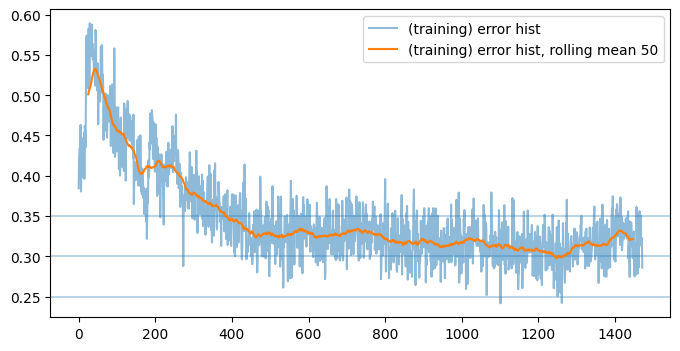

training batch  1471
batches:  1471
training batch  1472
batches:  1472
training batch  1473
batches:  1473
training batch  1474
batches:  1474
training batch  1475
batches:  1475
training batch  1476
batches:  1476
training batch  1477
batches:  1477
training batch  1478
batches:  1478
training batch  1479
batches:  1479
training batch  1480
batches:  1480


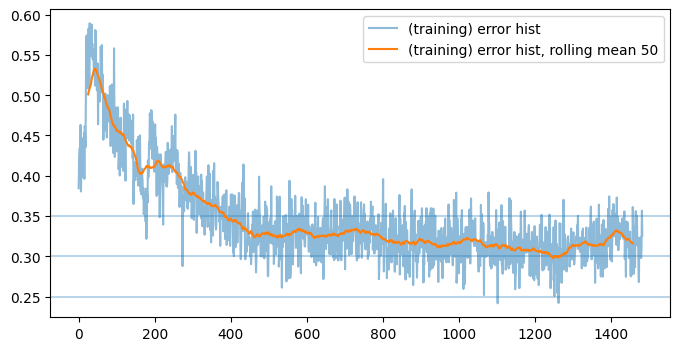

training batch  1481
batches:  1481
training batch  1482
batches:  1482
training batch  1483
batches:  1483
training batch  1484
batches:  1484
training batch  1485
batches:  1485
training batch  1486
batches:  1486
training batch  1487
batches:  1487
training batch  1488
batches:  1488
training batch  1489
batches:  1489
training batch  1490
batches:  1490


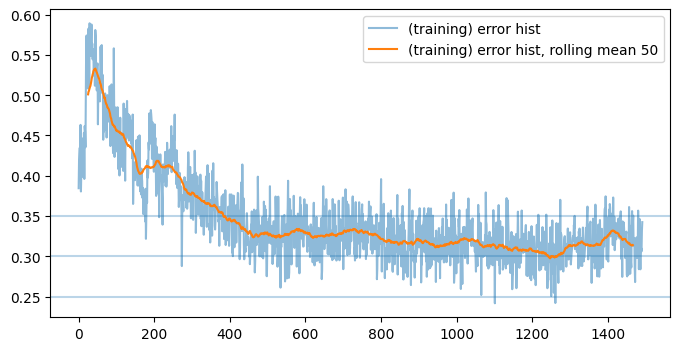

training batch  1491
batches:  1491
training batch  1492
batches:  1492
training batch  1493
batches:  1493
training batch  1494
batches:  1494
training batch  1495
batches:  1495
training batch  1496
batches:  1496
training batch  1497
batches:  1497
training batch  1498
batches:  1498
training batch  1499
batches:  1499
training batch  1500
batches:  1500


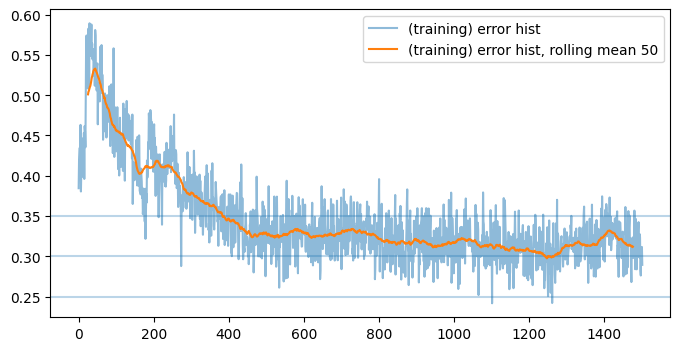

training batch  1501
batches:  1501
training batch  1502
batches:  1502
training batch  1503
batches:  1503
training batch  1504
batches:  1504
training batch  1505
batches:  1505
training batch  1506
batches:  1506
training batch  1507
batches:  1507
training batch  1508
batches:  1508
training batch  1509
batches:  1509
training batch  1510
batches:  1510


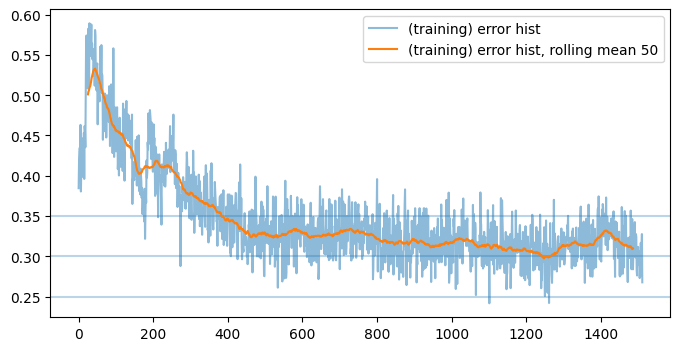

training batch  1511
batches:  1511
training batch  1512
batches:  1512
training batch  1513
batches:  1513
training batch  1514
batches:  1514
training batch  1515
batches:  1515
training batch  1516
batches:  1516
training batch  1517
batches:  1517
training batch  1518
batches:  1518
training batch  1519
batches:  1519
training batch  1520
batches:  1520


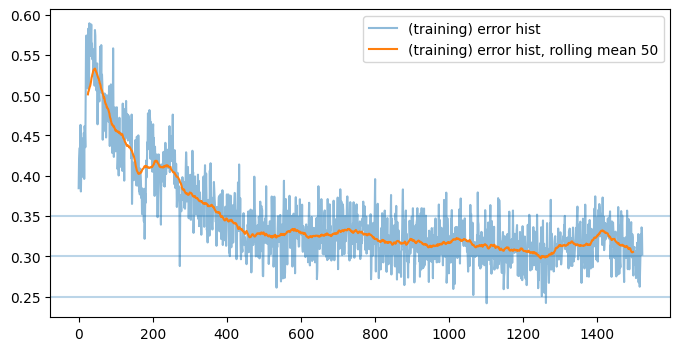

training batch  1521
batches:  1521
training batch  1522
batches:  1522
training batch  1523
batches:  1523
training batch  1524
batches:  1524
training batch  1525
batches:  1525
training batch  1526
batches:  1526
training batch  1527
batches:  1527
training batch  1528
batches:  1528
training batch  1529
batches:  1529
training batch  1530
batches:  1530


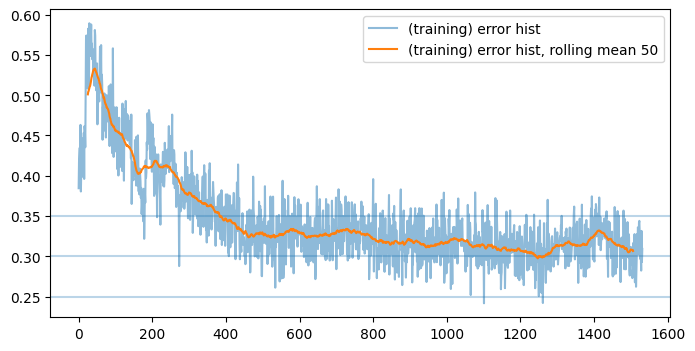

training batch  1531
batches:  1531
training batch  1532
batches:  1532
training batch  1533
batches:  1533
training batch  1534
batches:  1534
training batch  1535
batches:  1535
training batch  1536
batches:  1536
training batch  1537
batches:  1537
training batch  1538
batches:  1538
training batch  1539
batches:  1539
training batch  1540
batches:  1540


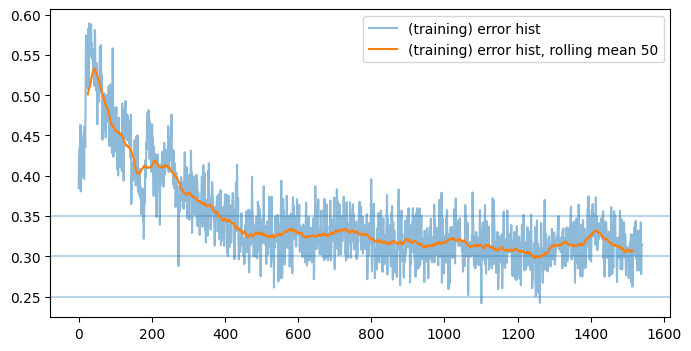

training batch  1541
batches:  1541
training batch  1542
batches:  1542
training batch  1543
batches:  1543
training batch  1544
batches:  1544
training batch  1545
batches:  1545
training batch  1546
batches:  1546
training batch  1547
batches:  1547
training batch  1548
batches:  1548
training batch  1549
batches:  1549
training batch  1550
batches:  1550


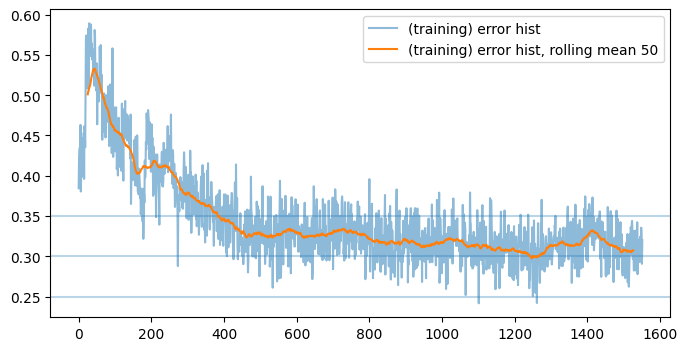

training batch  1551
batches:  1551
training batch  1552
batches:  1552
training batch  1553
batches:  1553
training batch  1554
batches:  1554
training batch  1555
batches:  1555
training batch  1556
batches:  1556
training batch  1557
batches:  1557
training batch  1558
batches:  1558
training batch  1559
batches:  1559
training batch  1560
batches:  1560


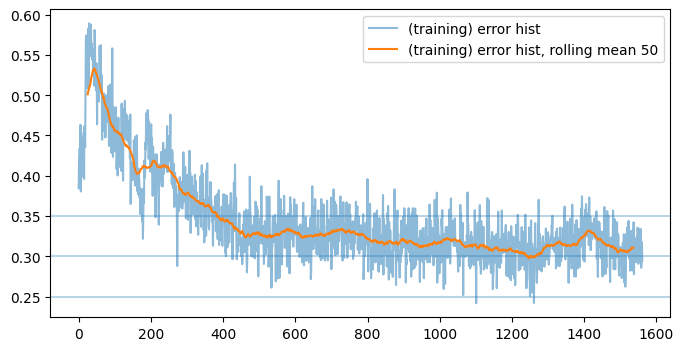

training batch  1561
batches:  1561
training batch  1562
batches:  1562
training batch  1563
batches:  1563
training batch  1564
batches:  1564
training batch  1565
batches:  1565
training batch  1566
batches:  1566
training batch  1567
batches:  1567
training batch  1568
batches:  1568
training batch  1569
batches:  1569
training batch  1570
batches:  1570


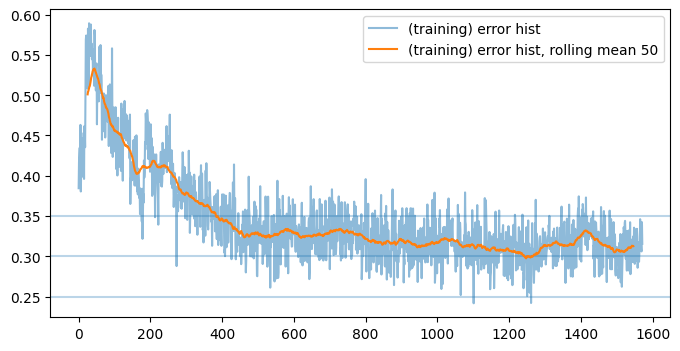

training batch  1571
batches:  1571
training batch  1572
batches:  1572
training batch  1573
batches:  1573
training batch  1574
batches:  1574
training batch  1575
batches:  1575
training batch  1576
batches:  1576
training batch  1577
batches:  1577
training batch  1578
batches:  1578
training batch  1579
batches:  1579
training batch  1580
batches:  1580


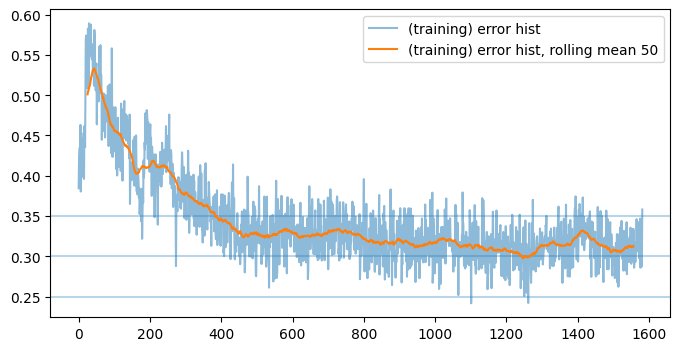

training batch  1581
batches:  1581
training batch  1582
batches:  1582
training batch  1583
batches:  1583
training batch  1584
batches:  1584
training batch  1585
batches:  1585
training batch  1586
batches:  1586
training batch  1587
batches:  1587
training batch  1588
batches:  1588
training batch  1589
batches:  1589
training batch  1590
batches:  1590


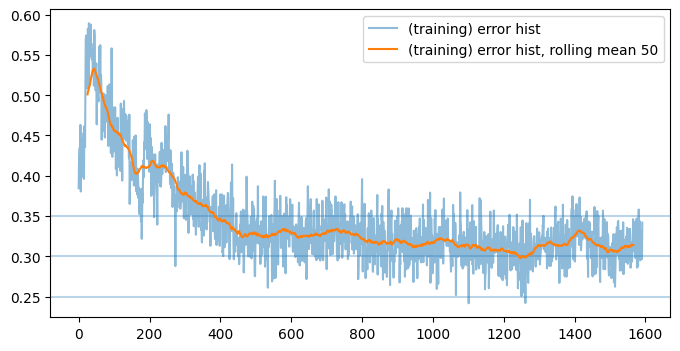

training batch  1591
batches:  1591
training batch  1592
batches:  1592
training batch  1593
batches:  1593
training batch  1594
batches:  1594
training batch  1595
batches:  1595
training batch  1596
batches:  1596
training batch  1597
batches:  1597
training batch  1598
batches:  1598
training batch  1599
batches:  1599
training batch  1600
batches:  1600


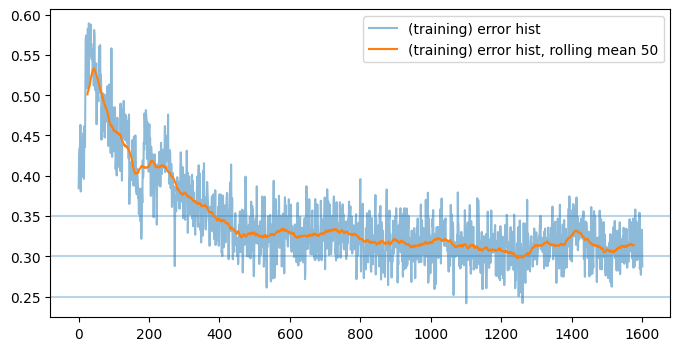

training batch  1601
batches:  1601
training batch  1602
batches:  1602
training batch  1603
batches:  1603
training batch  1604
batches:  1604
training batch  1605
batches:  1605
training batch  1606
batches:  1606
training batch  1607
batches:  1607
training batch  1608
batches:  1608
training batch  1609
batches:  1609
training batch  1610
batches:  1610


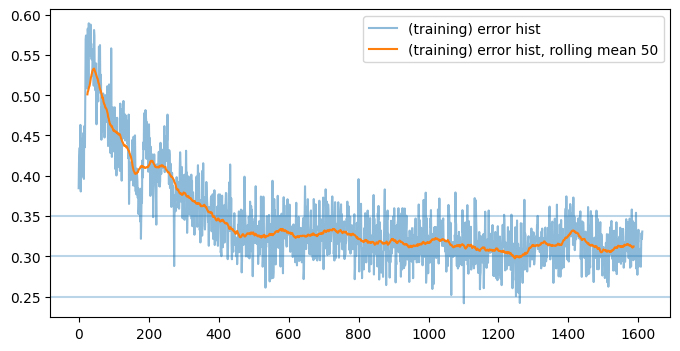

training batch  1611
batches:  1611
training batch  1612
batches:  1612
training batch  1613
batches:  1613
training batch  1614
batches:  1614
training batch  1615
batches:  1615
training batch  1616
batches:  1616
training batch  1617
batches:  1617
training batch  1618
batches:  1618
training batch  1619
batches:  1619
training batch  1620
batches:  1620


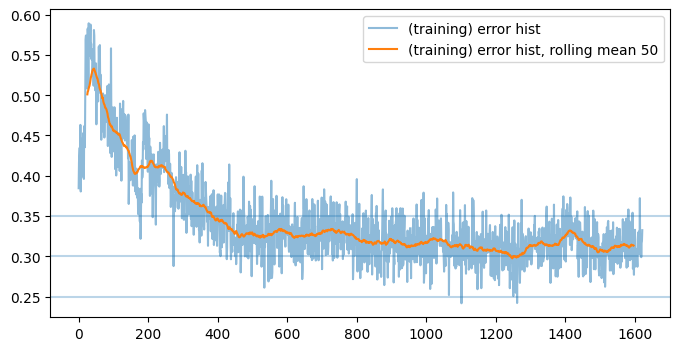

training batch  1621
batches:  1621
training batch  1622
batches:  1622
training batch  1623
batches:  1623
training batch  1624
batches:  1624
training batch  1625
batches:  1625
training batch  1626
batches:  1626
training batch  1627
batches:  1627
training batch  1628
batches:  1628
training batch  1629
batches:  1629
training batch  1630
batches:  1630


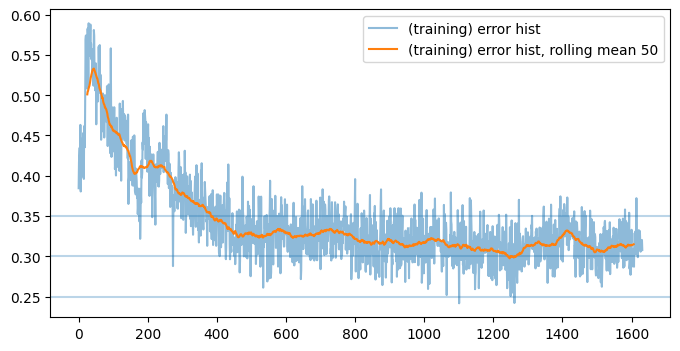

training batch  1631
batches:  1631
training batch  1632
batches:  1632
training batch  1633
batches:  1633
training batch  1634
batches:  1634
training batch  1635
batches:  1635
training batch  1636
batches:  1636
training batch  1637
batches:  1637
training batch  1638
batches:  1638
training batch  1639
batches:  1639
training batch  1640
batches:  1640


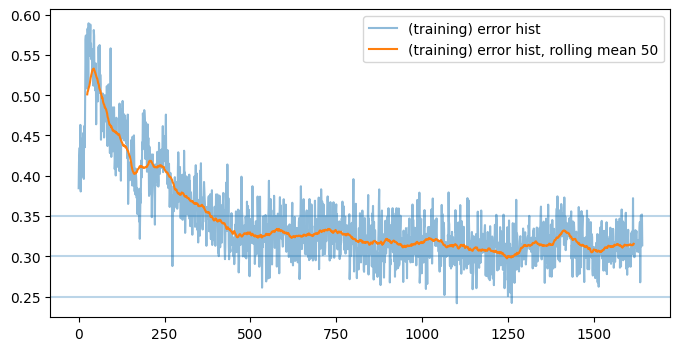

training batch  1641
batches:  1641
training batch  1642
batches:  1642
training batch  1643
batches:  1643
training batch  1644
batches:  1644
training batch  1645
batches:  1645
training batch  1646
batches:  1646
training batch  1647
batches:  1647
training batch  1648
batches:  1648
training batch  1649
batches:  1649
training batch  1650
batches:  1650


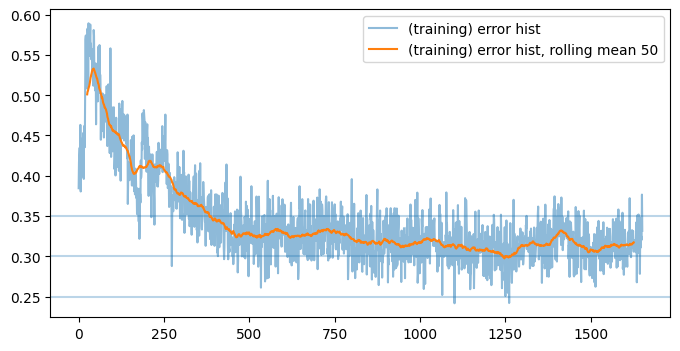

training batch  1651
batches:  1651
training batch  1652
batches:  1652
training batch  1653
batches:  1653
training batch  1654
batches:  1654
training batch  1655
batches:  1655
training batch  1656
batches:  1656
training batch  1657
batches:  1657
training batch  1658
batches:  1658
training batch  1659
batches:  1659
training batch  1660
batches:  1660


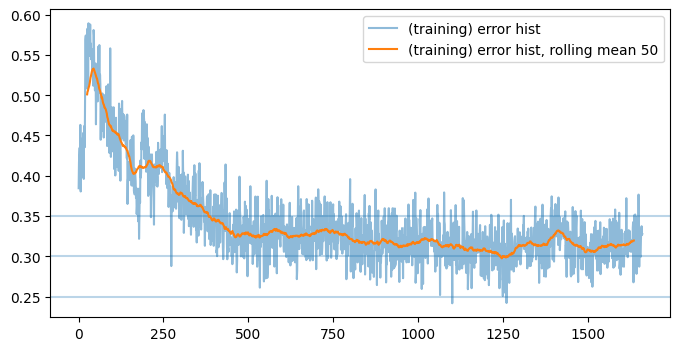

training batch  1661
batches:  1661
training batch  1662
batches:  1662
training batch  1663
batches:  1663
training batch  1664
batches:  1664
training batch  1665
batches:  1665
training batch  1666
batches:  1666
training batch  1667
batches:  1667
training batch  1668
batches:  1668
training batch  1669
batches:  1669
training batch  1670
batches:  1670


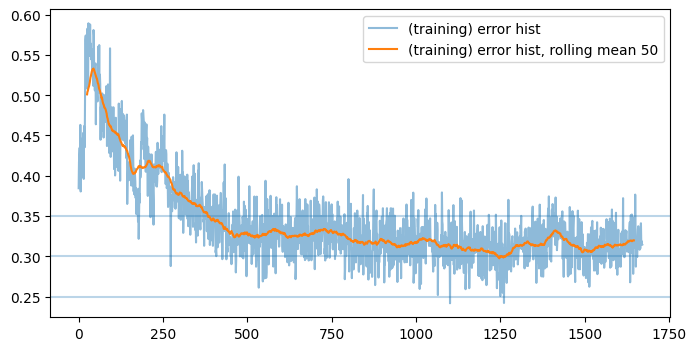

training batch  1671
batches:  1671
training batch  1672
batches:  1672
training batch  1673
batches:  1673
training batch  1674
batches:  1674
training batch  1675
batches:  1675
training batch  1676
batches:  1676
training batch  1677
batches:  1677
training batch  1678
batches:  1678
training batch  1679
batches:  1679
training batch  1680
batches:  1680


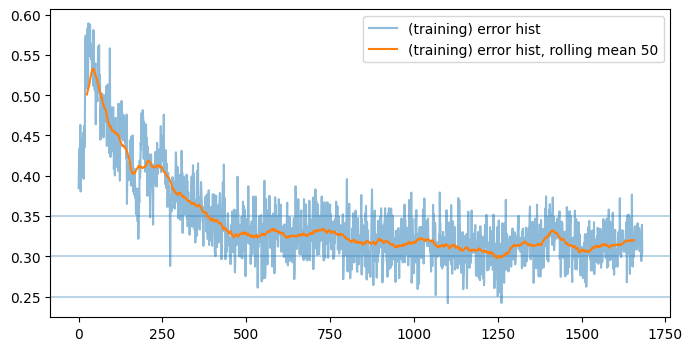

training batch  1681
batches:  1681
training batch  1682
batches:  1682
training batch  1683
batches:  1683
training batch  1684
batches:  1684
training batch  1685
batches:  1685
training batch  1686
batches:  1686
training batch  1687
batches:  1687
training batch  1688
batches:  1688
training batch  1689
batches:  1689
training batch  1690
batches:  1690


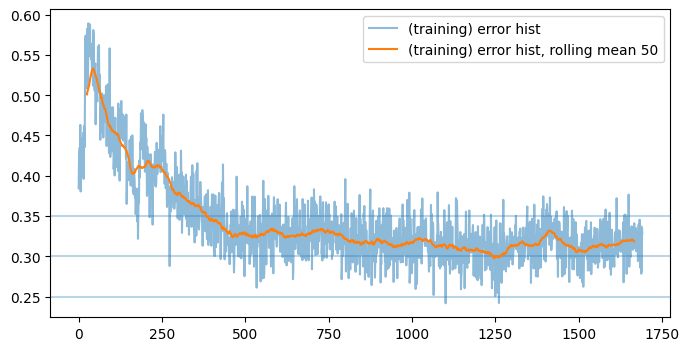

training batch  1691
batches:  1691
training batch  1692
batches:  1692
training batch  1693
batches:  1693
training batch  1694
batches:  1694
training batch  1695
batches:  1695
training batch  1696
batches:  1696
training batch  1697
batches:  1697
training batch  1698
batches:  1698
training batch  1699
batches:  1699
training batch  1700
batches:  1700


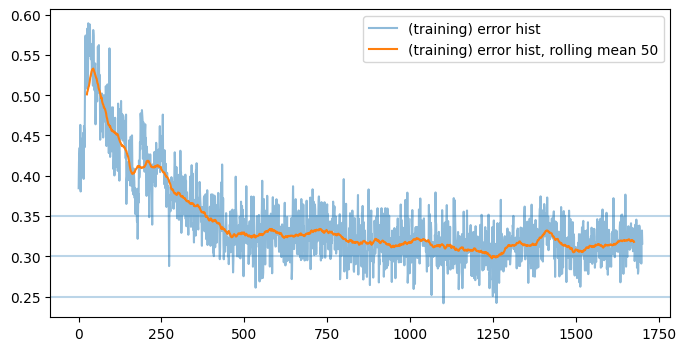

training batch  1701
batches:  1701
training batch  1702
batches:  1702
training batch  1703
batches:  1703
training batch  1704
batches:  1704
training batch  1705
batches:  1705
training batch  1706
batches:  1706
training batch  1707
batches:  1707
training batch  1708
batches:  1708
training batch  1709
batches:  1709
training batch  1710
batches:  1710


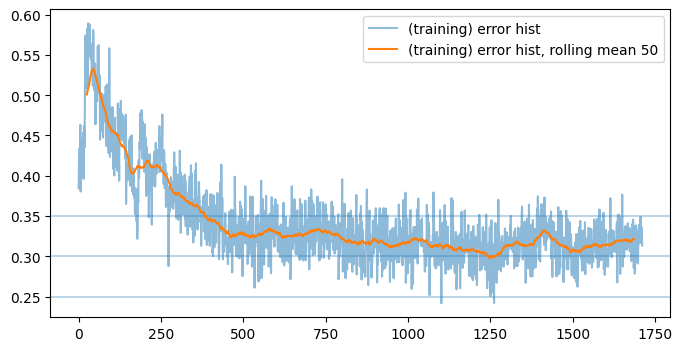

training batch  1711
batches:  1711
training batch  1712
batches:  1712
training batch  1713
batches:  1713
training batch  1714
batches:  1714
training batch  1715
batches:  1715
training batch  1716
batches:  1716
training batch  1717
batches:  1717
training batch  1718
batches:  1718
training batch  1719
batches:  1719
training batch  1720
batches:  1720


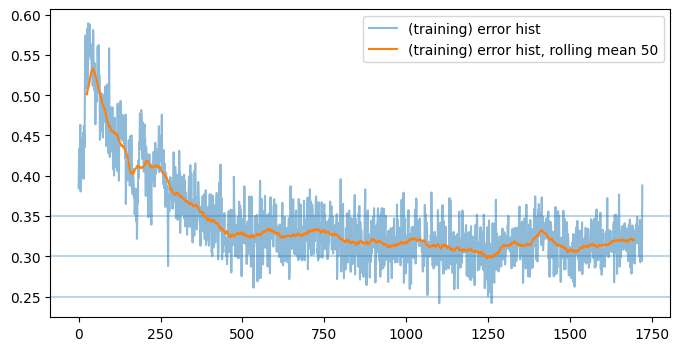

training batch  1721
batches:  1721
training batch  1722
batches:  1722
training batch  1723
batches:  1723
training batch  1724
batches:  1724
training batch  1725
batches:  1725
training batch  1726
batches:  1726
training batch  1727
batches:  1727
training batch  1728
batches:  1728
training batch  1729
batches:  1729
training batch  1730
batches:  1730


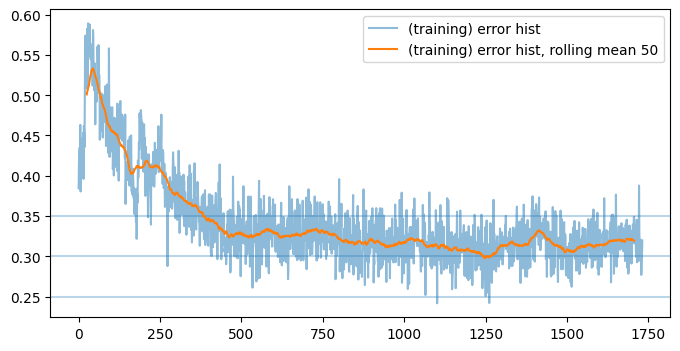

training batch  1731
batches:  1731
training batch  1732
batches:  1732
training batch  1733
batches:  1733
training batch  1734
batches:  1734
training batch  1735
batches:  1735
training batch  1736
batches:  1736
training batch  1737
batches:  1737
training batch  1738
batches:  1738
training batch  1739
batches:  1739
training batch  1740
batches:  1740


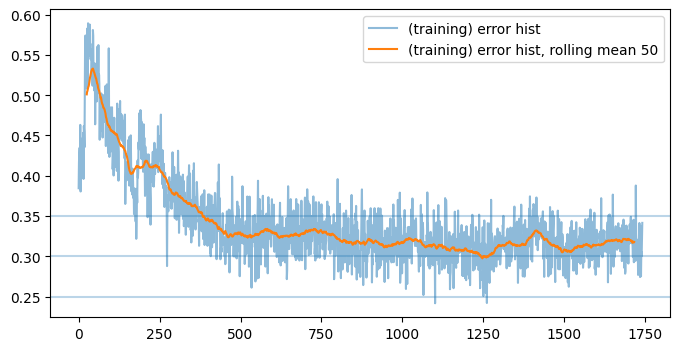

training batch  1741
batches:  1741
training batch  1742
batches:  1742
training batch  1743
batches:  1743
training batch  1744
batches:  1744
training batch  1745
batches:  1745
training batch  1746
batches:  1746
training batch  1747
batches:  1747
training batch  1748
batches:  1748
training batch  1749
batches:  1749
training batch  1750
batches:  1750


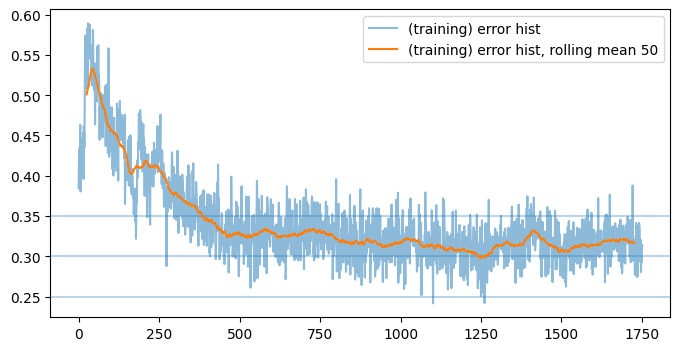

training batch  1751
batches:  1751
training batch  1752
batches:  1752
training batch  1753
batches:  1753
training batch  1754
batches:  1754
training batch  1755
batches:  1755
training batch  1756
batches:  1756
training batch  1757
batches:  1757
training batch  1758
batches:  1758
training batch  1759
batches:  1759
training batch  1760
batches:  1760


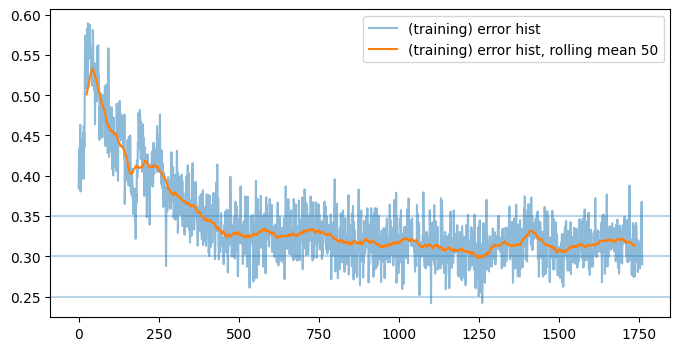

training batch  1761
batches:  1761
training batch  1762
batches:  1762
training batch  1763
batches:  1763
training batch  1764
batches:  1764
training batch  1765
batches:  1765
training batch  1766
batches:  1766
training batch  1767
batches:  1767
training batch  1768
batches:  1768
training batch  1769
batches:  1769
training batch  1770
batches:  1770


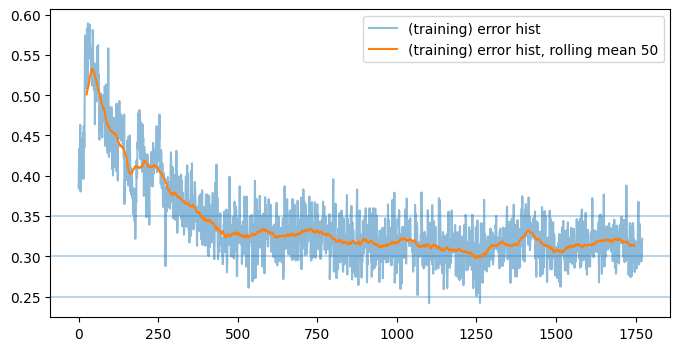

training batch  1771
batches:  1771
training batch  1772
batches:  1772
training batch  1773
batches:  1773
training batch  1774
batches:  1774
training batch  1775
batches:  1775
training batch  1776
batches:  1776
training batch  1777
batches:  1777
training batch  1778
batches:  1778
training batch  1779
batches:  1779
training batch  1780
batches:  1780


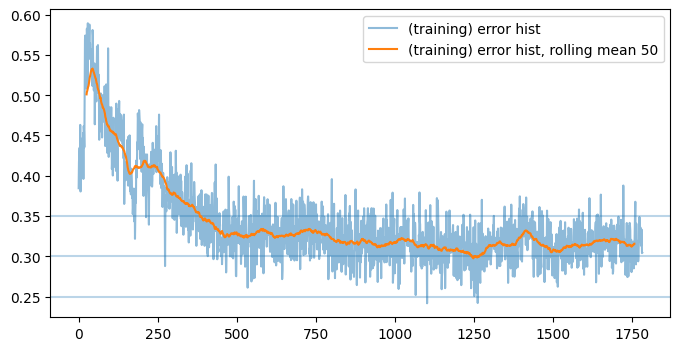

training batch  1781
batches:  1781
training batch  1782
batches:  1782
training batch  1783
batches:  1783
training batch  1784
batches:  1784
training batch  1785
batches:  1785
training batch  1786
batches:  1786
training batch  1787
batches:  1787
training batch  1788
batches:  1788
training batch  1789
batches:  1789
training batch  1790
batches:  1790


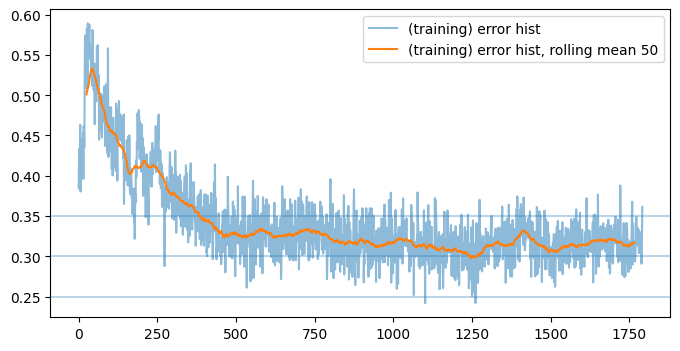

training batch  1791
batches:  1791
training batch  1792
batches:  1792
training batch  1793
batches:  1793
training batch  1794
batches:  1794
training batch  1795
batches:  1795
training batch  1796
batches:  1796
training batch  1797
batches:  1797
training batch  1798
batches:  1798
training batch  1799
batches:  1799
training batch  1800
batches:  1800


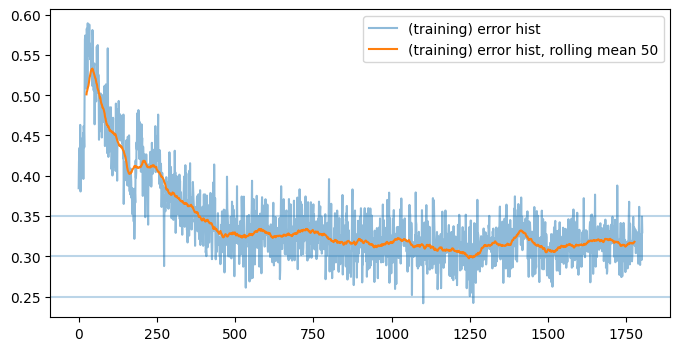

training batch  1801
batches:  1801
training batch  1802
batches:  1802
training batch  1803
batches:  1803
training batch  1804
batches:  1804
training batch  1805
batches:  1805
training batch  1806
batches:  1806
training batch  1807
batches:  1807
training batch  1808
batches:  1808
training batch  1809
batches:  1809
training batch  1810
batches:  1810


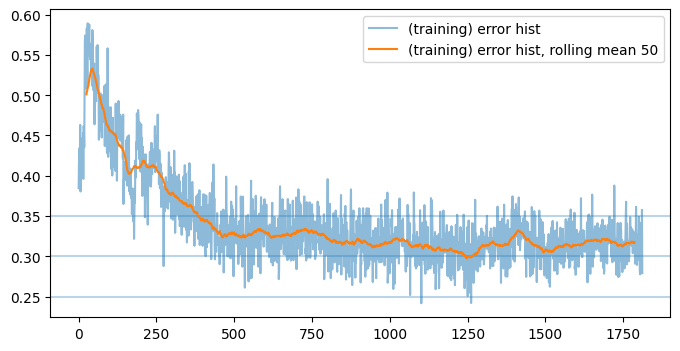

training batch  1811
batches:  1811
training batch  1812
batches:  1812
training batch  1813
batches:  1813
training batch  1814
batches:  1814
training batch  1815
batches:  1815
training batch  1816
batches:  1816
training batch  1817
batches:  1817
training batch  1818
batches:  1818
training batch  1819
batches:  1819
training batch  1820
batches:  1820


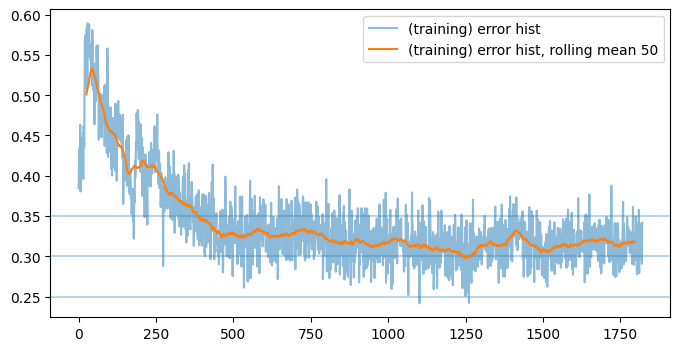

training batch  1821
batches:  1821
training batch  1822
batches:  1822
training batch  1823
batches:  1823
training batch  1824
batches:  1824
training batch  1825
batches:  1825
training batch  1826
batches:  1826
training batch  1827
batches:  1827
training batch  1828
batches:  1828
training batch  1829
batches:  1829
training batch  1830
batches:  1830


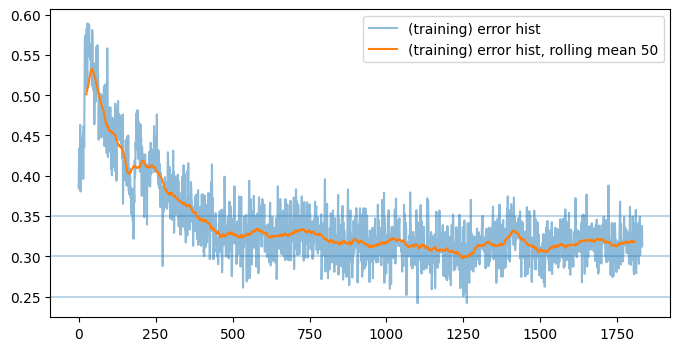

training batch  1831
batches:  1831
training batch  1832
batches:  1832
training batch  1833
batches:  1833
training batch  1834
batches:  1834
training batch  1835
batches:  1835
training batch  1836
batches:  1836
training batch  1837
batches:  1837
training batch  1838
batches:  1838
training batch  1839
batches:  1839
training batch  1840
batches:  1840


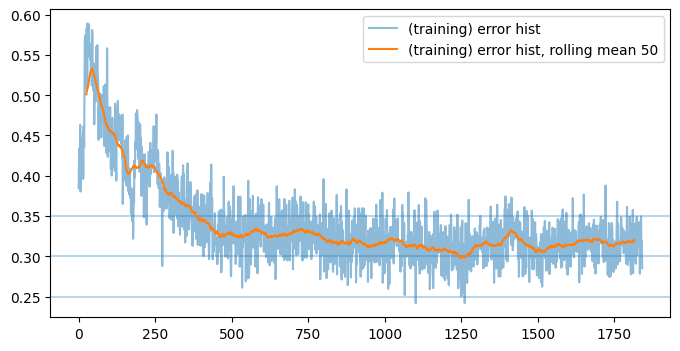

training batch  1841
batches:  1841
training batch  1842
batches:  1842
training batch  1843
batches:  1843
training batch  1844
batches:  1844
training batch  1845
batches:  1845
training batch  1846
batches:  1846
training batch  1847
batches:  1847
training batch  1848
batches:  1848
training batch  1849
batches:  1849
training batch  1850
batches:  1850


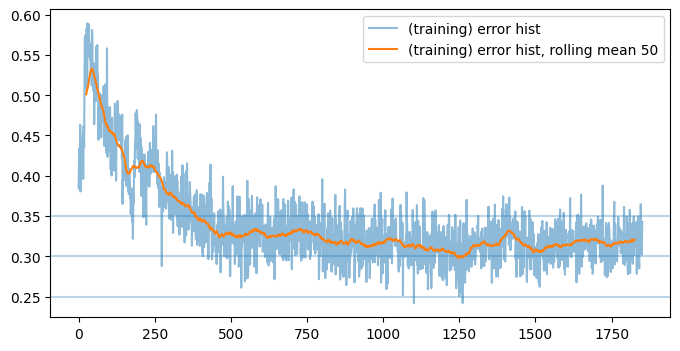

training batch  1851
batches:  1851
training batch  1852
batches:  1852
training batch  1853
batches:  1853
training batch  1854
batches:  1854
training batch  1855
batches:  1855
training batch  1856
batches:  1856
training batch  1857
batches:  1857
training batch  1858
batches:  1858
training batch  1859
batches:  1859
training batch  1860
batches:  1860


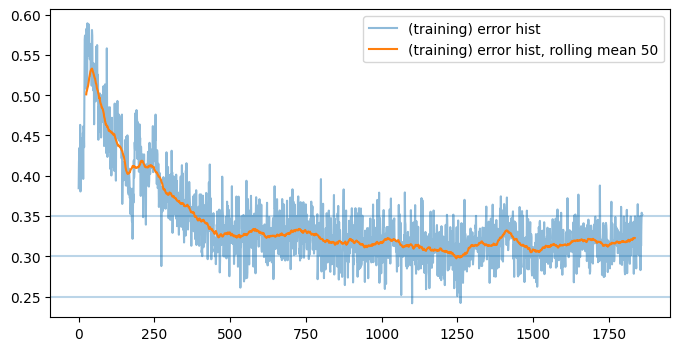

training batch  1861
batches:  1861
training batch  1862
batches:  1862
training batch  1863
batches:  1863
training batch  1864
batches:  1864
training batch  1865
batches:  1865
training batch  1866
batches:  1866
training batch  1867
batches:  1867
training batch  1868
batches:  1868
training batch  1869
batches:  1869
training batch  1870
batches:  1870


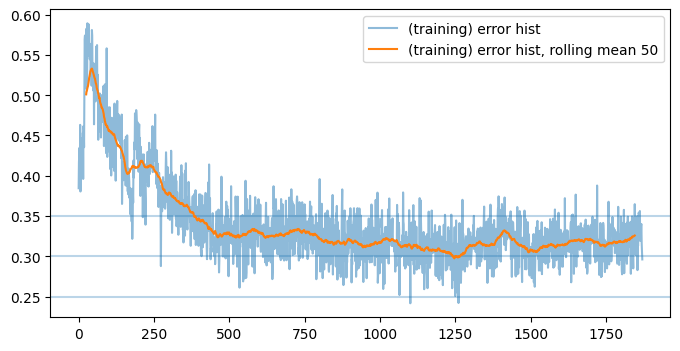

training batch  1871
batches:  1871
training batch  1872
batches:  1872
training batch  1873
batches:  1873
training batch  1874
batches:  1874
training batch  1875
batches:  1875
training batch  1876
batches:  1876
training batch  1877
batches:  1877
training batch  1878
batches:  1878
training batch  1879
batches:  1879
training batch  1880
batches:  1880


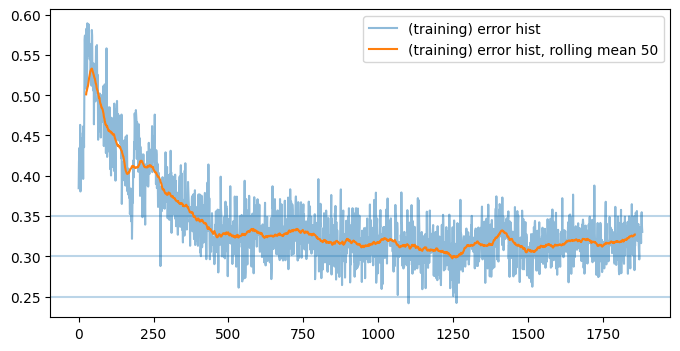

training batch  1881
batches:  1881
training batch  1882
batches:  1882
training batch  1883
batches:  1883
training batch  1884
batches:  1884
training batch  1885
batches:  1885
training batch  1886
batches:  1886
training batch  1887
batches:  1887
training batch  1888
batches:  1888
training batch  1889
batches:  1889
training batch  1890
batches:  1890


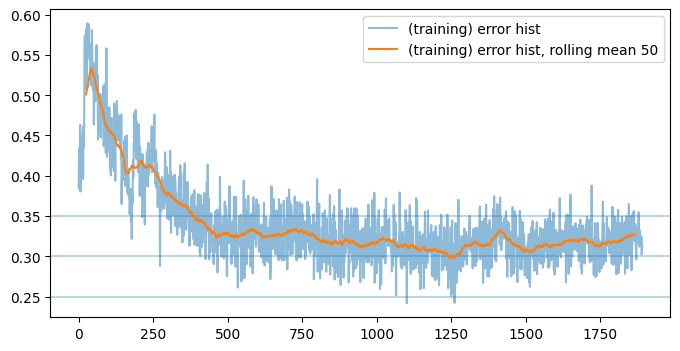

training batch  1891
batches:  1891
training batch  1892
batches:  1892
training batch  1893
batches:  1893
training batch  1894
batches:  1894
training batch  1895
batches:  1895
training batch  1896
batches:  1896
training batch  1897
batches:  1897
training batch  1898
batches:  1898
training batch  1899
batches:  1899
training batch  1900
batches:  1900


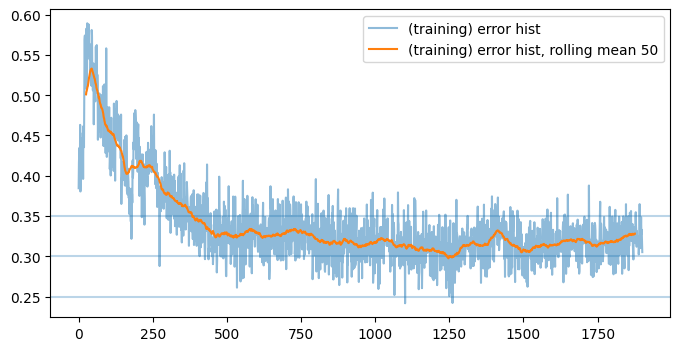

training batch  1901
batches:  1901
training batch  1902
batches:  1902
training batch  1903
batches:  1903
training batch  1904
batches:  1904
training batch  1905
batches:  1905
training batch  1906
batches:  1906
training batch  1907
batches:  1907
training batch  1908
batches:  1908
training batch  1909
batches:  1909
training batch  1910
batches:  1910


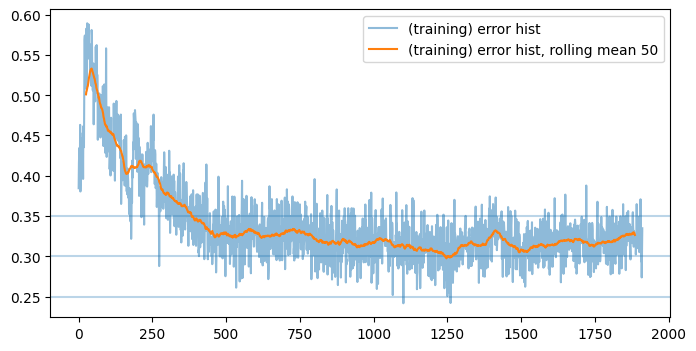

training batch  1911
batches:  1911
training batch  1912
batches:  1912
training batch  1913
batches:  1913
training batch  1914
batches:  1914
training batch  1915
batches:  1915
training batch  1916
batches:  1916
training batch  1917
batches:  1917
training batch  1918
batches:  1918
training batch  1919
batches:  1919
training batch  1920
batches:  1920


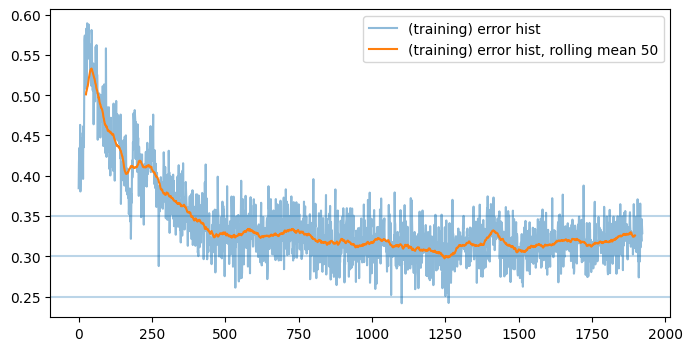

training batch  1921
batches:  1921
training batch  1922
batches:  1922
training batch  1923
batches:  1923
training batch  1924
batches:  1924
training batch  1925
batches:  1925
training batch  1926
batches:  1926
training batch  1927
batches:  1927
training batch  1928
batches:  1928
training batch  1929
batches:  1929
training batch  1930
batches:  1930


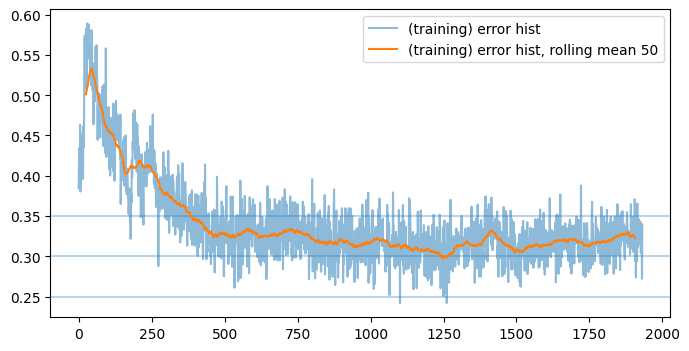

training batch  1931
batches:  1931
training batch  1932
batches:  1932
training batch  1933
batches:  1933
training batch  1934
batches:  1934
training batch  1935
batches:  1935
training batch  1936
batches:  1936
training batch  1937
batches:  1937
training batch  1938
batches:  1938
training batch  1939
batches:  1939
training batch  1940
batches:  1940


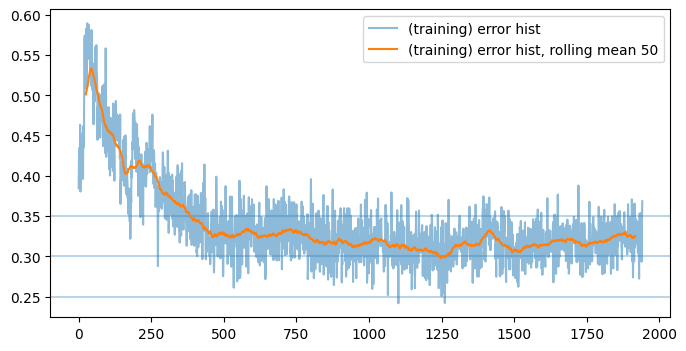

training batch  1941
batches:  1941
training batch  1942
batches:  1942
training batch  1943
batches:  1943
training batch  1944
batches:  1944
training batch  1945
batches:  1945
training batch  1946
batches:  1946
training batch  1947
batches:  1947
training batch  1948
batches:  1948
training batch  1949
batches:  1949
training batch  1950
batches:  1950


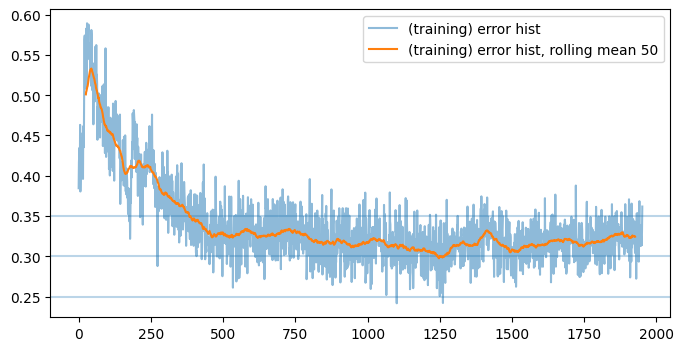

training batch  1951
batches:  1951
training batch  1952
batches:  1952
training batch  1953
batches:  1953
training batch  1954
batches:  1954
training batch  1955
batches:  1955
training batch  1956
batches:  1956
training batch  1957
batches:  1957
training batch  1958
batches:  1958
training batch  1959
batches:  1959
training batch  1960
batches:  1960


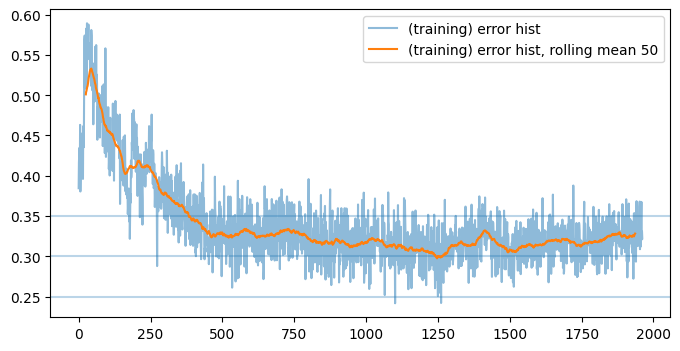

training batch  1961
batches:  1961
training batch  1962
batches:  1962
training batch  1963
batches:  1963
training batch  1964
batches:  1964
training batch  1965
batches:  1965
training batch  1966
batches:  1966
training batch  1967
batches:  1967
training batch  1968
batches:  1968
training batch  1969
batches:  1969
training batch  1970
batches:  1970


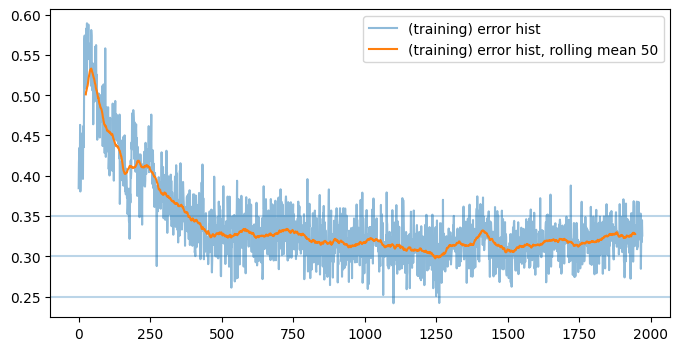

training batch  1971
batches:  1971
training batch  1972
batches:  1972
training batch  1973
batches:  1973
training batch  1974
batches:  1974
training batch  1975
batches:  1975
training batch  1976
batches:  1976
training batch  1977
batches:  1977
training batch  1978
batches:  1978
training batch  1979
batches:  1979
training batch  1980
batches:  1980


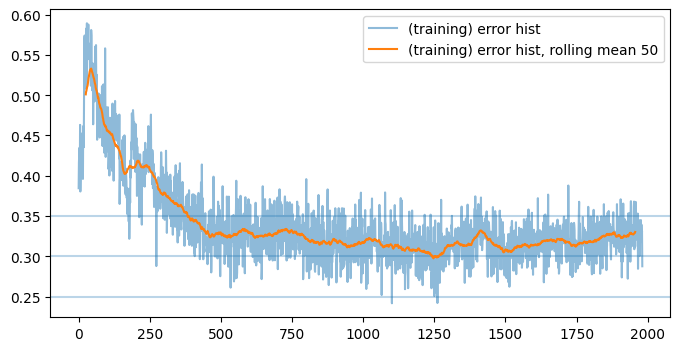

training batch  1981
batches:  1981
training batch  1982
batches:  1982
training batch  1983
batches:  1983
training batch  1984
batches:  1984
training batch  1985
batches:  1985
training batch  1986
batches:  1986
training batch  1987
batches:  1987
training batch  1988
batches:  1988
training batch  1989
batches:  1989
training batch  1990
batches:  1990


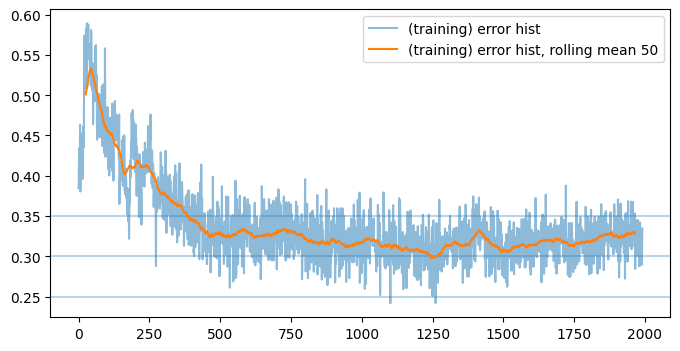

training batch  1991
batches:  1991
training batch  1992
batches:  1992
training batch  1993
batches:  1993
training batch  1994
batches:  1994
training batch  1995
batches:  1995
training batch  1996
batches:  1996
training batch  1997
batches:  1997
training batch  1998
batches:  1998
training batch  1999
batches:  1999
training batch  2000
batches:  2000


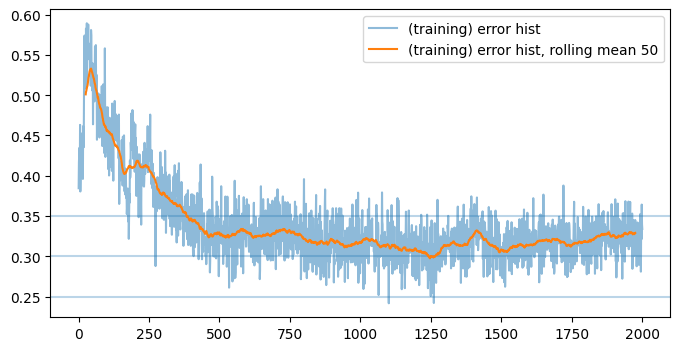

training batch  2001
batches:  2001
training batch  2002
batches:  2002
training batch  2003
batches:  2003
training batch  2004
batches:  2004
training batch  2005
batches:  2005
training batch  2006
batches:  2006
training batch  2007
batches:  2007
training batch  2008
batches:  2008
training batch  2009
batches:  2009
training batch  2010
batches:  2010


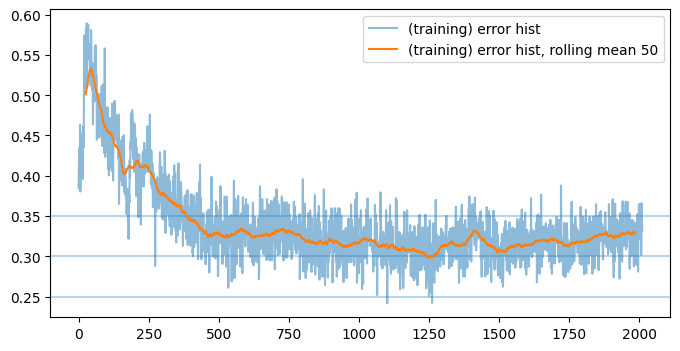

training batch  2011
batches:  2011
training batch  2012
batches:  2012
training batch  2013
batches:  2013
training batch  2014
batches:  2014
training batch  2015
batches:  2015
training batch  2016
batches:  2016
training batch  2017
batches:  2017
training batch  2018
batches:  2018
training batch  2019
batches:  2019
training batch  2020
batches:  2020


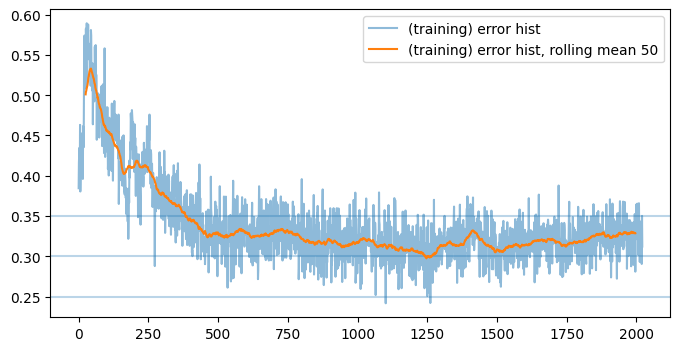

training batch  2021
batches:  2021
training batch  2022
batches:  2022
training batch  2023
batches:  2023
training batch  2024
batches:  2024
training batch  2025
batches:  2025
training batch  2026
batches:  2026
training batch  2027
batches:  2027
training batch  2028
batches:  2028
training batch  2029
batches:  2029
training batch  2030
batches:  2030


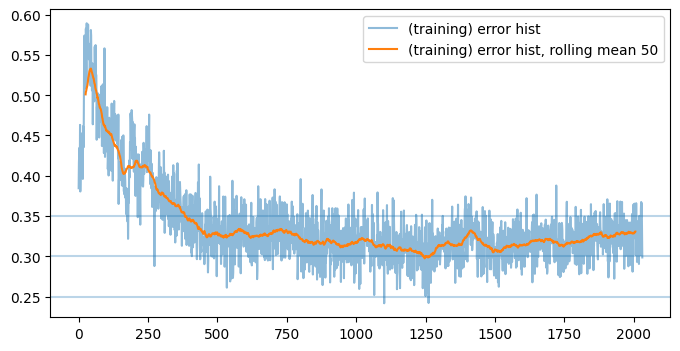

training batch  2031
batches:  2031
training batch  2032
batches:  2032
training batch  2033
batches:  2033
training batch  2034
batches:  2034
training batch  2035
batches:  2035
training batch  2036
batches:  2036
training batch  2037
batches:  2037
training batch  2038
batches:  2038
training batch  2039
batches:  2039
training batch  2040
batches:  2040


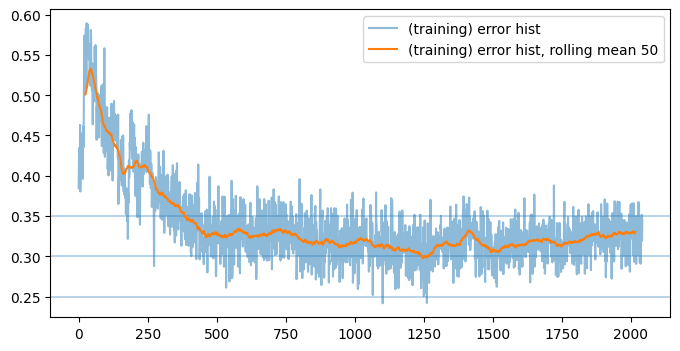

training batch  2041
batches:  2041
training batch  2042
batches:  2042
training batch  2043
batches:  2043
training batch  2044
batches:  2044
training batch  2045
batches:  2045
training batch  2046
batches:  2046
training batch  2047
batches:  2047
training batch  2048
batches:  2048
training batch  2049
batches:  2049


KeyboardInterrupt: 

In [15]:
lr0 = 1.5e-3
# a = 100 # for 1/n decay
b = - np.log(0.5) / 250 # for exp decap (half lr every 250 episodes)
n_batches = 100
n_replay = 10
weight_decay = 1e-7

av_window = 50 # window of averaging for error visual

while True:

    # wait for new data
    while True:
        try:
            with open('/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v27/stats', 'rb') as f:
                stats = torch.load(f)
        except:
            time.sleep(0.05)
            continue
        if stats[0] - 1 > latest_batch_index:
            newest_batch = stats[0] - 1
            break
        else:
            time.sleep(0.05)

    newest_batch = latest_batch_index + 1

    # load all new data
    inputs = []
    labels = []
    for index in range(latest_batch_index + 1, latest_batch_index + 2):
        inputs.append(torch.load('/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v27/inputs_{}'.format(index)))
        labels.append(torch.load('/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v27/labels_{}'.format(index)))

    inputs_tens = torch.cat(inputs).float() # bool -> float
    labels_tens = torch.cat(labels)

    # get error of new data (without backprop)
    out = model(inputs_tens)
    out = out.view(out.shape[0])
    loss = criterion(out, labels_tens)
    error_hist.append(loss.item())

    # load additional older data to replay
    if latest_batch_index > 5:
        # samples from exp distribution, more recent -> more likely
        decay_rate = 0.02
        prob =  np.exp(-decay_rate * np.arange(latest_batch_index)) 
        prob = prob/sum(prob)
        num_samples = n_replay
        samples = np.random.choice(np.arange(latest_batch_index, 0, -1), size=num_samples, p=prob)
        for index in samples:
            inputs.append(torch.load('/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v27/inputs_{}'.format(index)))
            labels.append(torch.load('/Users/Philip/Desktop/Projects/RL Chess/MCTS/Game Saves v27/labels_{}'.format(index)))

    inputs_tens = torch.cat(inputs).float() # bool -> float
    labels_tens = torch.cat(labels)

    print('training batch ', newest_batch)
    t0 = time.time()

    # training step
    model.train()
    # optimizer = optim.Adam(model.parameters(), lr=lr0 * a / (a + newest_batch), weight_decay=weight_decay)
    optimizer = optim.Adam(model.parameters(), lr=lr0 * np.exp(-b * newest_batch), weight_decay=weight_decay)

    # shuffle data and make mini batches
    indices = torch.randperm(len(inputs_tens))
    inputs_tens = inputs_tens[indices]
    labels_tens = labels_tens[indices]

    batch_size = len(inputs_tens) // n_batches

    inputs_loader = inputs_tens.split(batch_size)
    labels_loader = labels_tens.split(batch_size)

    for inputs, labels in zip(inputs_loader, labels_loader):

        out = model(inputs)
        out = out.view(out.shape[0])
        loss = criterion(out, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # print('training done ({}s)'.format(time.time() - t0))

    if newest_batch % 1 == 0 and newest_batch > 0:

        print('batches: ', newest_batch)
    
    torch.save(error_hist, './error_hist MC v27')

    if newest_batch % 10 == 0 and newest_batch > 0:
        plt.figure(figsize=(8, 4))

        plt.axhline(0.35, xmin=0, xmax=1000, alpha=0.3)
        plt.axhline(0.30, xmin=0, xmax=1000, alpha=0.3)
        plt.axhline(0.25, xmin=0, xmax=1000, alpha=0.3)

        plt.plot(error_hist, label='(training) error hist', alpha=0.5)
        plt.plot(range(av_window//2, len(error_hist) - av_window//2), [np.mean(error_hist[i:(i+av_window)]) for i in range(len(error_hist) - av_window)], label='(training) error hist, rolling mean '+str(av_window))
        plt.legend()

        plt.show()

    if newest_batch % 2 == 0 and newest_batch > 0:
        torch.save(model.state_dict(), './Model Saves MC v27/model_{}_batches'.format(newest_batch))

    latest_batch_index = newest_batch